##Import all the packages


In [ ]:
import os
from google.colab import drive
from pathlib import Path
from datetime import datetime

drive.mount('/content/gdrive')
home_path = Path("/content/gdrive/MyDrive/CPP_data")
os.chdir(home_path)

print(home_path)
print(os.getcwd())

Mounted at /content/gdrive
/content/gdrive/MyDrive/CPP_data
/content/gdrive/MyDrive/CPP_data


In [ ]:
import numpy as np
import pandas as pd
import pyarrow 
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from sklearn.decomposition import PCA
#from sklearn.preprocessing import StandardScaler
import re

#import boto3
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
from torch.autograd import Variable

from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from pathlib import Path
import plotly.express as px
# from learn.dataset import TabularDataset
# from learn.model import CiteAutoencoder
# from learn.train import train_model, get_encodings

!pip install umap-learn
!pip install umap-learn[parametric_umap]
!pip install umap-learn[plot]
import umap

import copy
import random


     |████████████████████████████████| 88 kB 3.5 MB/s 
     |████████████████████████████████| 1.1 MB 30.1 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82829 sha256=dcef73927d5758d7dc97be6ce52d9213f1ea39d3023eabbd5b7f8ce2f2028404
  Stored in directory: /root/.cache/pip/wheels/b3/52/a5/1fd9e3e76a7ab34f134c07469cd6f16e27ef3a37aeff1fe821
  Created wheel for pynndescent: filename=pynndescent-0.5.6-py3-none-any.whl size=53943 sha256=1bf67e0003bb4dcbe8da9c0c755c1c61dbac9027b0ee1349ec027539ac53bbb1
  Stored in directory: /root/.cache/pip/wheels/03/f1/56/f80d72741e400345b5a5b50ec3d929aca581bf45e0225d5c50
Successfully built umap-learn pynndescent
     |████████████████████████████████| 462 kB 5.2 MB/s 
     |████████████████████████████████| 18.2 MB 479 kB/s 
     |████████████████████████████████| 76 kB 4.8 MB/s 
     |████████████████████████████████| 837 kB 42.2 MB/s 
     |████████████████████████████████| 136 kB 49.8 MB/s 
     |███████████████████

##UNIVERSAL FUNCTIONS

###Markers

In [ ]:
#MARKERS
markers_all = dict()
markers_all = {'immune' : ["PTPRC"],
'stroma' : ["FAP","HTRA1","FBN1"],
'epithel' : ["KRT2","KRT7","KRT8","VIL1","KRT19","KRT20","CLDN7","EPCAM","MUC1","KRT18","CLDN4"],
'melanocyte': ["MIA","SLC45A2","PMEL","MLANA"],
'keratinocyte': ["KRT1","KRT2","KRT5","KRT10","KRT14","KRT15"],
'tcell': ["CD3E","CD3D","CD3G"],
'bcell': ["FCRL1","FCRLA","PAX5","MS4A1","CD19","CD79B","CLEC17A","CD22","CD79A"],
'myeloid': ["CCR1","CD68","CD14","CSF1R","CD163","IGSF6","C5AR1","LILRA5"],
'neutrophil': ["CXCR2","TMEM252","ALPL","KRT23","FCGR3B","FCGR3A","MGAM","CXCR1","HIST2H2AA4"],
'm2': ["MSR1","CD38","HLA-DRA","HLA-DRB1","HLA-DRB5","MRC1","C1QA"],
'natural_killer': ["NCAM1","NCR1","KLRB1","FCGR3A","FGFBP2","GZMB"],
'plasma': ["DERL3","SDC1","PRDX4","SSR4","JCHAIN","FKBP11"],
'cd4': ["CD4"],
'cd8': ["CD8A","CD8B"],
'treg': ["IL2RA","FOXP3","CCR8"],
'naive': ["TCF7","IL7R","CCR7","SELL","LEF1","LTB"],
'early': ["GZMK","SH2D1A","EOMES","DTHD1","SLAMF7","FCRL3","CD28","CXCR5"],
'exhausted': ["HAVCR2","ENTPD1","GZMB","LAYN","CD38","VCAM1","TOX","LAG3"],
'cycling': ["MKI67","TOP2A"],
'tismem': ["ITGAE","ZNF683","ITGA1"],
'eff': ["FCGR3A","FGFBP2","CX3CR1","SORL1","S1PR1","KLF2","KLRG1","LILRB1"],
'caf': ["S100A4","CD248","PDPN","THY1","COL1A1","COL1A2","COL6A1","COL6A2","COL6A3","DCN"],
'pericyte': ["CSPG4","RGS5","ACTA2","DES","PDGFRB"],
'endothel': ["PECAM1","FLT4","STAB1","FLT1","ICAM1","ICAM2","SELE","SELP","VWF","CD34","CDH5"]}


In [ ]:
markers_four = dict()
markers_four = {'Naive': ["TCF7","IL7R","CCR7","SELL","LEF1","LTB"],
'EarlyMemory': ["GZMK","SH2D1A","EOMES","DTHD1","SLAMF7","FCRL3","CXCR5"],
'Exhausted': ["HAVCR2","ENTPD1","LAYN","CD38","VCAM1","TOX","LAG3"],
'TissueResidentMemory': ["ITGAE","ZNF683","ITGA1"],
'AbundantGenes':["GAPDH","RPL19","ACTB","PTPRC","CD3D","CD3E","CD3G","CD8A","CD8B"],
'CheckPoints':["CTLA4","PDCD1","TIGIT","PVRIG","CD96","CD226"]
}

In [ ]:
markers_last = dict()
markers_last = {
    'Naive': ["TCF7","IL7R","CCR7","SELL","LEF1","LTB"],
    'EarlyMemory': ["GZMK","SH2D1A","EOMES","DTHD1","SLAMF7","FCRL3","CXCR5"],
    'Exhausted': ["HAVCR2","ENTPD1","LAYN","CD38","VCAM1","TOX","LAG3"],
    'TissueResidentMemory': ["ITGAE","ZNF683","ITGA1"],
    'TEM':["FCGR3A","FGFBP2","CX3CR1","LILRB1","SORL1"],
    'Cycling':["TOP2A","MKI67"],
    'CirculatingMemory':["NR4A1","NR4A2","NR4A3","KLF2"],
    'AbundantGenes':["GAPDH","RPL19","ACTB","PTPRC","CD3D","CD3E","CD3G","CD8A","CD8B"],
    'CheckPoints':["CTLA4","PDCD1","TIGIT","PVRIG","CD96","CD226"]
    }

'''
EarlyMemory <- c("CXCR5","GZMK","SH2D1A","EOMES","DTHD1","SLAMF7","FCRL3")  "CD28"
Exhausted <- c("HAVCR2","ENTPD1","LAYN","CD38","LAG3","VCAM1","TOX")   "GZMB"

TEM <- c("FCGR3A","FGFBP2","CX3CR1","LILRB1","SORL1")
CirculatingMemory <- c("NR4A1","NR4A2","NR4A3","KLF2")

# last addition from Yossef (dark gray)
AbundantGenes <- c("GAPDH","RPL19","ACTB","PTPRC","CD3D","CD3E","CD3G","CD8A","CD8B")

Last confirmation from Yossef:
EarlyMemory <- c("CXCR5","GZMK","SH2D1A","EOMES","DTHD1","SLAMF7","FCRL3")

Exhausted <- c("HAVCR2","ENTPD1","LAYN","CD38","LAG3","VCAM1","TOX")

Naive <- c("TCF7","CCR7","IL7R","LEF1","SELL","LTB")

TissueResidentMemory <- c("ITGAE","ITGA1","ZNF683")

TEM <- c("FCGR3A","FGFBP2","CX3CR1","LILRB1","SORL1")

Cycling <- c("TOP2A","MKI67")

CirculatingMemory <- c("NR4A1","NR4A2","NR4A3","KLF2")
The abundant genes are just to make sure there is no bias related to gene expression.

AbundantGenes <- c("GAPDH","RPL19","ACTB","PTPRC","CD3D","CD3E","CD3G","CD8A","CD8B")


The Check Point genes are what we currently studying. They are not a set of cell state specific markers
''' 

'\nEarlyMemory <- c("CXCR5","GZMK","SH2D1A","EOMES","DTHD1","SLAMF7","FCRL3")  "CD28"\nExhausted <- c("HAVCR2","ENTPD1","LAYN","CD38","LAG3","VCAM1","TOX")   "GZMB"\n\nTEM <- c("FCGR3A","FGFBP2","CX3CR1","LILRB1","SORL1")\nCirculatingMemory <- c("NR4A1","NR4A2","NR4A3","KLF2")\n\n# last addition from Yossef (dark gray)\nAbundantGenes <- c("GAPDH","RPL19","ACTB","PTPRC","CD3D","CD3E","CD3G","CD8A","CD8B")\n\nLast confirmation from Yossef:\nEarlyMemory <- c("CXCR5","GZMK","SH2D1A","EOMES","DTHD1","SLAMF7","FCRL3")\n\nExhausted <- c("HAVCR2","ENTPD1","LAYN","CD38","LAG3","VCAM1","TOX")\n\nNaive <- c("TCF7","CCR7","IL7R","LEF1","SELL","LTB")\n\nTissueResidentMemory <- c("ITGAE","ITGA1","ZNF683")\n\nTEM <- c("FCGR3A","FGFBP2","CX3CR1","LILRB1","SORL1")\n\nCycling <- c("TOP2A","MKI67")\n\nCirculatingMemory <- c("NR4A1","NR4A2","NR4A3","KLF2")\nThe abundant genes are just to make sure there is no bias related to gene expression.\n\nAbundantGenes <- c("GAPDH","RPL19","ACTB","PTPRC","CD3D","CD3

###Upload dataset, filter by cells needed, add markers

In [ ]:
def add_markers_dataset(dataset, markers, col_name):
    '''
    adding additional columns to dataset according to marker sets
    markers - dictionary of markers
    col_name - the name of the new column created
    '''
    count=0
    dataset[col_name] = 'none'
    print('*****************ADDING MARKERS COLUMNS TO DATASET*********************')
    for key in markers.keys():
      count_key=0
      for each in markers[key]:
          dataset.loc[(dataset['gene'] == each), col_name] = key
          count+=1
          count_key+=1
      print(f'Total markers for key {key} is: {count_key}')
    print('Total number of markers found', count)
    markers_count = dataset[col_name].value_counts()
    print('*' * 70)
    return dataset

def check_markers(dataset, markers):
    count=0
    dataset['marker'] = 'none'
    print('*' * 70)
    for key in markers.keys():
      count_key=0
      #print('Checking markers from set', key)
      for each in markers[key]:
        if len(dataset.loc[(dataset['gene'] == each)]) >0:
          dataset.loc[(dataset['gene'] == each), 'marker'] = key
          #print('Found', each)
          count+=1
          count_key+=1
        else:
          print('Not found', each)
      print(f'Total markers for key {key} is: {count_key}')
    print('Total number of markers found', count)
    markers_count = dataset['marker'].value_counts()
    main_markers = {k: v for k, v in markers.items() if k not in ['AbundantGenes', 'CheckPoints']}
    print('The main markers count ', markers_count[main_markers].sum())
    print('The Checkpoints count ', markers_count[check_points].sum())
    print('The markers for check purposes count ', markers_count[markers_check].sum())
    print('*' * 70)

    return dataset

def filtering_some_genes(dataset):
#filtering Mitochondrial and the Mirna genes according to Amit instruction
#genes <- colnames(tGSEdata)[-grep(x=colnames(tGSEdata),pattern="^R[NUP]|^MT-|^MIR",perl=T)]

#"^R[NUP]|^MT-|^MIR”
#RN
#RU
#RP
#MT- only 1 and not in the beginning 
#MIR - 1258
#343 R[NUP]
  print('*' * 70)
  r = re.compile("R[NUP]")
  #excluding R[NUP]
  print('The total number of genes filtered out by R[NUP] : ', len(dataset[dataset.gene.str.match(r)]))
  if len(dataset[dataset.gene.str.match(r)]) > 0:
    dataset = dataset[~dataset.gene.str.match(r)]
  r = re.compile("MIR")
  print('The total number of genes filtered out by MIR : ', len(dataset[dataset.gene.str.match(r)]))
  if len(dataset[dataset.gene.str.match(r)]) > 0:
    dataset = dataset[~dataset.gene.str.match(r)]
  r = re.compile("MT")
  print('The total number of genes filtered out by MT : ', len(dataset[dataset.gene.str.match(r)]))
  if len(dataset[dataset.gene.str.match(r)]) > 0:
    dataset = dataset[~dataset.gene.str.match(r)]
  print('Final dataset shape: ', dataset.shape)
  print('*' * 70)
  return dataset

def create_all_markers_ref_set(dataset, markers):
    all_markers = []
    for key in markers.keys():
      all_markers+= markers[key]
    all_markers_dataset = dataset.copy()
    all_markers_dataset.set_index('gene', inplace=True)
    all_indxs = all_markers_dataset.index
    to_delete = np.setdiff1d(all_indxs, all_markers)
    all_markers_dataset = all_markers_dataset.drop(index=to_delete, axis=0)
    #all_markers_dataset
    print('Total number of markers used', len(all_markers_dataset))
    all_markers_dataset.reset_index(inplace=True)
    #print('all_markers_dataset', all_markers_dataset.columns)
    
    return all_markers_dataset

def add_markers(dataset_f, dataset_markers):
    '''
    adding markers (themselves) to the filtered dataset if they were filtered out
    dataset_f - filtered dataset
    dataset_or - original dataset (a benchmark)
    markers - dict of markers
    '''
  #function adds markers to the dataset
    count = 0
    count_tot = len(dataset_markers)
    print('*' * 70)
    for index, row in dataset_markers.iterrows():
      if len(dataset_f.loc[(dataset_f['gene'] == row['gene'])]) == 0:
          # if there is no such marker in the final dataset
          print('Found gene that was absent. Adding it...', row['gene'])
          dataset_f=dataset_f.append(row)  
          count+=1
    print('Total number of markers', count_tot)
    print('Total number of markers added', count)
    print('*' * 70)
    dataset_f = dataset_f.sort_index()
    return dataset_f

def initial_filter_of_dataset(home_path, path_dataset, path_labels, list_markers, cell_name_to_filter='TTC', filter_mit=True, save=False):
    '''
    filters data for the following processing (PCA or NN) - filter by cells and mit genes
    home_path - working path
    path_dataset - path to the dataset
    path_labels - path to the cells labels
    cell_name_to_filter - 'TTC' or 'CD8' or None if the data is filtered already
    filter_mit - filter by mithohondrial genes or not
    save - to save csv or not
    output is dataset with columns: 'gene', cells, 'markers9' and 'markers6'
    '''
    dataset = pd.read_parquet(path_dataset)
    column_names = dataset.columns
    #print(column_names[:5])
    if 'symbol' in column_names:
        dataset.columns = ['gene' if x=='symbol' else x for x in dataset.columns]
    if 'GENE' in column_names:
        dataset.columns = ['gene' if x=='GENE' else x for x in dataset.columns]
    
    print('Initial dataset shape:', dataset.shape)

    labels = pd.read_csv(path_labels, '\t', header=None)
    print(dataset_name, ' labels shape:', labels.shape)
    print(labels[1].value_counts())
    labels = labels.loc[labels[1] == cell_name_to_filter]
    labels.drop(1, axis=1, inplace=True)
    labels_list = labels.to_numpy().reshape(1, -1)

    #all the columns of the whole dataset
    columns = dataset.columns[1:]
    #we have to find the columns that are NOT in CD8/TTC set
    col_to_drop = [x for x in columns if x not in labels_list]
    #now we remove these columns from the dataset
    dataset = dataset.drop(col_to_drop, axis=1)
    print('Dataset filtered by cells needed (',cell_name_to_filter, '), final shape:', dataset.shape)
    
    #adding columns to dataset identify markers group (according to markers dictionary)
    if list_markers != None:
      filter=''
      for markers_dict in list_markers:
          col_name='markers' + str(len(markers_dict))
          add_markers_dataset(dataset, markers_dict, col_name)
          filter+=col_name + " "
      all_markers_dataset = dataset[(dataset[filter.split()[0]] != 'none') | (dataset[filter.split()[1]] != 'none')]

    if filter_mit:
      print('*' * 70)
      print('Filtering Mitochondrial and Mirna genes..')
      dataset_filtered = filtering_some_genes(dataset)
    #in case some important genes were deleted we have to check all the markers again
    dataset_filtered = add_markers(dataset, all_markers_dataset)
    
    if save:          
      name_file = dataset_name + '_filtered_allmarkers.gzip'
      dataset_filtered.to_parquet(os.path.join(home_path, name_file), compression='gzip')

    return dataset_filtered    


###Preparing data for PCA and running PCA

In [ ]:
def variance_set(X, x_labels):
  genes_var = X.mean(axis=1,skipna=True, numeric_only=True).to_frame()
  genes_var.rename(columns={0:'Mean'}, inplace=True)
  genes_var['Std'] = X.std(axis=1,skipna=True, numeric_only=True)
  genes_var = genes_var.join(x_labels)
  '''
  genes_var = pd.DataFrame(data=X.var(axis=1), columns=['Var'])
  print('variance tables shape', genes_var.shape)
  print('x_labels', x_labels.shape)
  print('x_labels index', x_labels.index)
  print('genes_var index', genes_var.index)
  print('difference in indexes', np.setdiff1d(x_labels.index, genes_var.index))
  print(X.shape)
  genes_var['Mean'] = X.mean(axis=1,skipna=True, numeric_only=True)
  genes_var['Std'] = X.std(axis=1,skipna=True, numeric_only=True)
  print('variance tables shape', genes_var.shape)
  genes_var = genes_var.join(x_labels)
  '''
  print('variance table', genes_var.head())
  print('variance tables shape', genes_var.shape)
  print('*' * 70)
  return genes_var

def check_var_thresh(dataset,th_mean, th_std_ratio):
  print('Mean mean value by genes', dataset.Mean.mean(axis=0))
  print('Mean std value by genes', dataset.Std.mean(axis=0))
  check=dataset[(dataset.Mean>th_mean)&((dataset.Std/dataset.Mean)>th_std_ratio)]
  print(check.shape)



def prep_data_PCA(markers, th_mean, th_std_ratio, home_path=None, path_dataset=None, dataset_name=None, dataset=None, save=False):
  '''
  takes the filtered dataset and returns training set for PCA task
  it can work with ready dataset (dataset param) OR 
  by providing path to it (including home_path)
  '''
  if not home_path is None:
    name_file = dataset_name + 'filtered_allmarkers.gzip'
    dataset = pd.read_parquet(os.path.join(home_path, name_file)).reset_index(drop=True)
  elif not dataset is None:
    print('Dataset shape: ', dataset.shape)

    x_labels = dataset['gene']
    x_markers = dataset['marker']
    print('x_labels shape', x_labels.shape, 'x_markers shape', x_markers.shape)
    X = dataset.drop(['gene', 'marker'], axis=1)
    if dataset['marker'].isna().sum() > 0:
      dataset['marker'].fillna('none', inplace=True)
    print('Markers values: \n', dataset['marker'].value_counts())
    X = np.log2(X+1)
    X['gene'] = x_labels
    X['marker'] = x_markers
    print('X for PCA shape: ', X.shape)
    #calculating variance for every gene
    genes_var = variance_set(X, x_labels)
    #filtering genes according to the threshold
    training_set = X[(genes_var.Mean>th_mean)&((genes_var.Std/genes_var.Mean)>th_std_ratio)]
    print('Training set shape', training_set.shape)
    print('Adding markers (check if they were deleted)')
    all_markers_dataset = X[(dataset['marker'] != 'none')].copy()
    training_set = add_markers(training_set, all_markers_dataset)
    #print('Final check')
    check_markers(training_set, markers)
    print('The final dataset shape for PCA: ', training_set.shape)
    print('*' * 70)
    if training_set.columns[0] == 'gene':
      cols = training_set.columns.to_list()
      cols = cols[1:-2] + cols[:1] + cols[-1:]
      training_set = training_set[cols]
    training_set = training_set.sort_index()
    print(training_set.columns)
    if save:
      name_file= dataset_name +'_' + str(len(markers)) +'_trainingset_' + '_' + datetime.now().strftime("%d-%m_%H:%M") + '.csv'
      print('Saving training set to csv file...')
      training_set.to_csv(os.path.join(home_path, name_file), index=False)

    return training_set, genes_var 
  else:
    print('Not enough params provided')


def running_PCA(dataset, home_path, num_comp=10):
  '''
  we input training_set to run PCA on it (by default using 10 components)
  if you need to save the results to csv file you need to provide home_path
  if you DO NOT need to save the results to csv file you should provide home_path=None
  '''
  var_pc=np.zeros(num_comp)
  gene_labels_fin = dataset['gene'].reset_index(drop=True)
  gene_markers_fin = dataset['marker'].reset_index(drop=True)
  print('markers check: \n', gene_markers_fin.value_counts())
  tr_x_indxs=dataset.index
  X_train = dataset.drop(['gene', 'marker'], axis=1)
  print('X_train shape: ', X_train.shape)
  print('************************************************')
  print("Principal Component Analysis (PCA)")
  pca = PCA(n_components = num_comp)
  X_pca = pca.fit_transform(X_train)
  col_names = list(' ') * num_comp
  for i in range(num_comp):
    col_names[i] = 'PC' + str(i+1)

  pca_df = pd.DataFrame(data=X_pca, columns=col_names)
  pca_df = pd.concat([pca_df, gene_labels_fin], axis=1)
  pca_df = pd.concat([pca_df, gene_markers_fin], axis=1)
  print('explained var by components', np.round(pca.explained_variance_ratio_,5))
  for i in range(var_pc.shape[0]):
    var_pc[i] = np.round(pca.explained_variance_ratio_*100,5)[i]

  #adding date and time to the saved file
  if not home_path is None:
    name_file= dataset_name +'_' + str(len(markers)) +'_PCA_'+ str(num_comp) + '_' + datetime.now().strftime("%d-%m_%H:%M") + '.csv'
    print('Saving results of PCA to csv file...')
    pca_df.to_csv(os.path.join(home_path, name_file), index=False)
  return pca_df, var_pc

def plotting_res_sns(df, var_pc, comp1, comp2, color_marker, title):
    '''
    takes pca_df and variable with components and the names of the components we are interested in
    comp1 and comp2 are STRINGS in the following format: 'PC1', 'PC2', etc
    '''
    sns.set_style("white")
    indx1 = int(comp1[-1]) - 1 
    indx2 = int(comp2[-1]) - 1
    f, ax = plt.subplots(figsize=(16, 8))
    p1 = sns.scatterplot(x=comp1,y=comp2,data=df, linewidth=0.2, s=30, alpha=1,
                         hue='marker', legend='full', palette=color_marker)
    p1.set_title(title)
    plt.xlabel(comp1 + ' - ' + str(var_pc[indx1])[:4] + '%')
    plt.ylabel(comp2 + ' - ' + str(var_pc[indx2])[:4] + '%')

    #for line in range(0,df.shape[0]):
     # if pca_df.PC1[line] > 200:
      #  p1.text(pca_df.PC1[line]+0.01, pca_df.PC2[line], 
       # pca_df.gene[line], horizontalalignment='left', 
        #size='small', color='black', weight='regular')
    #plt.legend()
    plt.show()

def plotting_res_plotly(df, var_pc, comp1, comp2, color_marker, title):
    '''
    plotting the same results but with different tool (interactive)
    '''
    indx1 = int(comp1[-1]) - 1 
    indx2 = int(comp2[-1]) - 1

    fig = px.scatter(df, x=comp1, y=comp2, color="marker", hover_name='gene', #text='gene',
                    labels={
                        comp1: comp1 + ' - ' + str(var_pc[indx1])[:4] + '%',
                        comp2: comp2 + ' - ' + str(var_pc[indx2])[:4] + '%'},
                    
                    color_discrete_sequence=['lightgray','black', 'darkgreen', 'purple', 'red', 'blue','lightgreen', 'cyan','darkgray', 'yellow'],
                    color_discrete_map= color_marker,
                    title= title)

    fig.show()


def plotting_UMAP_sns(df, comp1, comp2, color_marker, title):
    '''
    prints results using UMAP
    takes pca_df and variable with components and the names of the components we are interested in
    comp1 and comp2 are STRINGS in the following format: 'PC1', 'PC2', etc
    '''
    sns.set_style("white")
    indx1 = int(comp1[-1]) - 1 
    indx2 = int(comp2[-1]) - 1
    f, ax = plt.subplots(figsize=(16, 8))
    p1 = sns.scatterplot(x=comp1,y=comp2,data=df, linewidth=0.2, 
                         #s=30, 
                         alpha=1, hue='marker', legend='full',
                     palette=color_marker,
                     #size = np.where(df.marker == 'none',1,6)
                     )
    p1.set_title(title)
    plt.xlabel('UMAP1')
    plt.ylabel('UMAP2')
    plt.show()


def plotting_UMAP_plotly(df, comp1, comp2, color_marker, title):
    '''
    printing the same map but with plotly (interactive map)
    '''
    fig = px.scatter(df, x=comp1, y=comp2, color="marker", hover_name='gene', #text='gene',
                    color_discrete_map= color_marker,
                    #size=np.where(df.marker == 'none',1,6),
                    title= title)
    fig.show()


def pca_to_print_func(pca_df, var_pc, dim_size, markers, color_marker):
  '''
  takes PCA table for dim_size dimensions and prints the result
  '''
  pca_to_print=pca_df[pca_df.columns[:dim_size]].copy()
  pca_to_print = pd.concat([pca_to_print, pca_df[pca_df.columns[-2:]]], axis=1)
  title = str(len(markers)) + ' markers, PCA - ' + str(dim_size) +'components'
  plotting_res_sns(pca_to_print, var_pc[:dim_size], 'PC2', 'PC3',color_marker, title)
  plotting_res_plotly(pca_df, var_pc, 'PC2', 'PC3',color_marker, title)  



'''
Naive, Exhausted, TissueResidentMemory, EarlyMemory,TEM,CirculatingMemory,Cycling,CheckPoints, Abundant

Blue, light green,cyan, red, purple,dark green,yellow,black, dark gray
'''




'\nNaive, Exhausted, TissueResidentMemory, EarlyMemory,TEM,CirculatingMemory,Cycling,CheckPoints, Abundant\n\nBlue, light green,cyan, red, purple,dark green,yellow,black, dark gray\n'

### UMAP (embedding and plotting the result)

In [ ]:
def umap_embedding(encodings, gene_labels_fin, gene_markers_fin, color_marker, title):
  '''
  takes encoding as an argument and print UMAP map
  '''
  embedding = umap.UMAP(random_state=0).fit_transform(encodings)
  print(embedding.shape)
  print(encodings.shape, gene_labels_fin.shape, gene_markers_fin.shape)
  plot_emb_res=pd.concat([gene_labels_fin, gene_markers_fin], axis=1)
  plot_emb_res["UMAP1"] = embedding[:, 0]
  plot_emb_res["UMAP2"] = embedding[:, 1]
  #plot_emb_res.head()
  plotting_UMAP_plotly(plot_emb_res, 'UMAP1', 'UMAP2', color_marker, title)
  plotting_UMAP_sns(plot_emb_res, 'UMAP1', 'UMAP2', color_marker, title)  



###Model

In [ ]:
from torch.utils.data import Dataset

class TabularDataset(Dataset):
    """Custome dataset for tabular data"""
    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        x = self.data[idx]
        return x, x


from collections import defaultdict
from tqdm import tqdm


def train_model(model, train_dl, valid_dl, lr, epochs, verbose=True):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    #optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    optimizer = torch.optim.SGD(model.parameters(), lr=lr)
    #scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=lr,
     #                                              steps_per_epoch=len(train_dl), epochs=epochs)
    scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr=lr/1000, max_lr=lr)
    criterion = nn.MSELoss()
    history = defaultdict(list)
    mean_losses = []
    for epoch in tqdm(range(1, epochs + 1)):
        model.train()  
        train_loss = 0
        #train_loss2 = 0
        nsamples_train = 0
        for x, y in train_dl:
            optimizer.zero_grad()

            # Forward pass
            x_prime = model(x.to(device))
            loss = criterion(x_prime, y.to(device))
            # Backward pass
            loss.backward()
            optimizer.step()
            scheduler.step()
            
            # log losses
            b_size = x.shape[0]
            nsamples_train += b_size
            train_loss += b_size*(loss.item())   
        valid_loss = 0
        nsamples_valid = 0
        
        model = model.eval()
        
        with torch.no_grad():
            for x, y in valid_dl:
                x_prime = model(x.to(device))

                loss = criterion(x_prime, y.to(device))
                
                # log losses
                b_size = x.shape[0]
                nsamples_valid += b_size
                valid_loss += b_size*(loss.item())
                
        train_loss = train_loss / nsamples_train
        valid_loss = valid_loss / nsamples_valid

        history['train'].append(train_loss)
        history['valid'].append(valid_loss)

        
        if verbose and epoch%10==0:
            print(f'Epoch {epoch}: train loss {train_loss}; valid loss {valid_loss}')


    return model, history

def get_encodings(model, dl):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    with torch.no_grad():
        encodings = [model.encoder(x.to(device)) for x, _ in dl]
    return torch.cat(encodings, dim=0)


class LinBnDrop(nn.Sequential):
    """Module grouping `BatchNorm1d`, `Dropout` and `Linear` layers, adapted from fastai."""
    
    def __init__(self, n_in, n_out, bn=True, p=0., act=None, lin_first=True):
        layers = [nn.BatchNorm1d(n_out if lin_first else n_in)] if bn else []
        if p != 0: layers.append(nn.Dropout(p))
        lin = [nn.Linear(n_in, n_out, bias=not bn)]
        if act is not None: lin.append(act)
        layers = lin+layers if lin_first else layers+lin
        super().__init__(*layers)


class Encoder(nn.Module):
    """Encoder for CITE-seq data"""
    
    def __init__(self, nfeatures_rna, nfeatures_pro, hidden_rna, hidden_pro, z_dim):
        super().__init__()
        self.nfeatures_rna = nfeatures_rna
        self.nfeatures_pro = nfeatures_pro

        if nfeatures_rna > 0:
            self.encoder_rna = LinBnDrop(nfeatures_rna, hidden_rna, p=0.1, act=nn.LeakyReLU())

        if nfeatures_pro > 0:
            self.encoder_protein = LinBnDrop(nfeatures_pro, hidden_pro, p=0.1, act=nn.LeakyReLU())

        # make sure hidden_rna and hidden_pro are set correctly
        hidden_rna = 0 if nfeatures_rna == 0 else hidden_rna
        hidden_pro = 0 if nfeatures_pro == 0 else hidden_pro
        
        self.encoder = LinBnDrop(hidden_rna + hidden_pro, z_dim, act=nn.LeakyReLU())

    def forward(self, x):
        if self.nfeatures_rna > 0 and self.nfeatures_pro > 0:
            x_rna = self.encoder_rna(x[:, :self.nfeatures_rna])
            x_pro = self.encoder_protein(x[:, self.nfeatures_rna:])
            x = torch.cat([x_rna, x_pro], 1)

        elif self.nfeatures_rna > 0 and self.nfeatures_pro == 0:
            x = self.encoder_rna(x)

        elif self.nfeatures_rna == 0 and self.nfeatures_pro > 0:
            x = self.encoder_protein(x)
            
        return self.encoder(x)


class Decoder(nn.Module):
    """Decoder for CITE-seq data"""
    def __init__(self, nfeatures_rna, nfeatures_pro, hidden_rna, hidden_pro, z_dim):
        super().__init__()
        self.nfeatures_rna = nfeatures_rna
        self.nfeatures_pro = nfeatures_pro

        # make sure hidden_rna and hidden_pro are set correctly
        hidden_rna = 0 if nfeatures_rna == 0 else hidden_rna
        hidden_pro = 0 if nfeatures_pro == 0 else hidden_pro

        hidden = hidden_rna + hidden_pro

        self.decoder = nn.Sequential(
            LinBnDrop(z_dim, hidden, act=nn.LeakyReLU()),
            LinBnDrop(hidden, nfeatures_rna + nfeatures_pro, bn=False)
            )

    def forward(self, x):
        x = self.decoder(x)
        return x

        
class CiteAutoencoder(nn.Module):
    def __init__(self, nfeatures_rna=0, nfeatures_pro=0, hidden_rna=400, hidden_pro=0, z_dim=20):
        """ Autoencoder for citeseq data """
        super().__init__()
 
        self.encoder = Encoder(nfeatures_rna, nfeatures_pro, hidden_rna, hidden_pro, z_dim)
        self.decoder = Decoder(nfeatures_rna, nfeatures_pro, hidden_rna, hidden_pro, z_dim)


    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


In [ ]:
#Data preparation for the model

def data_prep_train_for_NN(training_set, n_dim, n_epochs, batch_size, lr=1e-2, save_model=False, VAE=False):
  print('*' * 70)
  print(f'Modeling for {n_dim} dimensions')
  gene_labels_fin = training_set['gene']
  #.reset_index(drop=True).copy()
  gene_markers_fin = training_set['marker']
  X_nn = training_set.drop(['gene', 'marker'], axis=1)
  #X_nn = X_nn.iloc[:, :-2]
  print(f'Shape of the dataset for the modelling: {X_nn.shape}')
  train, valid = train_test_split(X_nn.to_numpy(dtype=np.float32), test_size=0.1, random_state=0)
  print(f'Shape of the train set: {train.shape}, shape of the validation set {valid.shape}')
  nfeatures  = X_nn.shape[1]
  print(f'Number of features for the train: {nfeatures}')
  train_ds = TabularDataset(train)
  valid_ds = TabularDataset(valid)
  train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=2, drop_last=True)
  valid_dl = DataLoader(valid_ds, batch_size=batch_size, shuffle=False, num_workers=2, drop_last=True)
  #x, y = next(iter(train_dl))
  #x.shape, y.shape
  if VAE:
    model = VAE_CiteAutoencoder(nfeatures_rna=nfeatures, nfeatures_pro=0, hidden_rna=400, hidden_pro=0, z_dim=n_dim)
  else:
    model = CiteAutoencoder(nfeatures_rna=nfeatures, nfeatures_pro=0, hidden_rna=400, hidden_pro=0, z_dim=n_dim)
  
  print(model)
  #lr = 1e-2
  #epochs = n_epochs

  ##########
  if VAE:
    model, losses = train_VAE(model, train_dl, valid_dl, lr=lr, epochs=n_epochs)
  else:
    model, losses = train_model(model, train_dl, valid_dl, lr=lr, epochs=n_epochs)
  fig =  plt.plot(figsize=(15,5))
  plt.plot(losses['train'], label = 'Train loss')
  plt.plot(losses['valid'], label='Validation loss')
  plt.legend()
  plt.show()
  if save_model:
    path_model = home_path + 'model' + dataset_name + str(n_dim) + datetime.now().strftime("%d-%m_%H:%M")
    torch.save(model.state_dict(), path_model)

  return model, X_nn, gene_labels_fin, gene_markers_fin



def test_NN_print_result(model, X_nn, gene_labels_fin, gene_markers_fin, n_dim, batch_size, save_enc=False):
  test_ds = TabularDataset(X_nn.to_numpy(dtype=np.float32))
  test_dl = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

  encodings = get_encodings(model, test_dl)
  encodings = encodings.cpu().numpy()
  print(f'Encoding shape: {encodings.shape}')
  columns = list(range(1, n_dim+1))
  encodings_df = pd.DataFrame(data=encodings, columns=columns)
  if save_enc:
    res = pd.concat([encodings_df, gene_labels_fin, gene_markers_fin], axis=1)
    print(f'Saving csv file with the results of NN modeling, dimensions {n_dim}, markers {len(markers)}')
    name_file= dataset_name +'_' + str(len(markers)) +'_NN_'+ str(n_dim) + '_' + datetime.now().strftime("%d-%m_%H:%M") + '.csv'
    res.to_csv(os.path.join(home_path, name_file))

  return encodings_df

#def printing_UMAP_NNres(encodings, gene_labels_fin, gene_markers_fin):
 # return


#Running code on different datasets

###Filtering datasets and saving them for future usage

In [ ]:
index_dataset = 0
datasets = ['NSCLC', 'crc1', 'crc2', 'hepa', 'mel']
dataset_name = datasets[index_dataset]
home_path = '/content/gdrive/MyDrive/CPP_data/'
path_dataset = '/content/gdrive/MyDrive/CPP_data/' + datasets[index_dataset] + '.parquet.gzip'
path_labels = '/content/gdrive/MyDrive/CPP_data/labels_' + datasets[index_dataset]
#filter initial datasets by cells TTC/CD8
NSCLC_filtered = initial_filter_of_dataset(home_path, path_dataset, path_labels, [markers_four, markers_last], cell_name_to_filter='TTC', filter_mit=True, save=True)
NSCLC_filtered.shape


Initial dataset shape: (23459, 12347)
NSCLC  labels shape: (12346, 2)
TTC      2182
TTH      1591
PTC      1323
PTH      1254
TTR      1100
NTC       934
TTY       892
PTR       849
PTY       672
NTH       655
NTY       238
PTS       162
NTR       149
NTS       139
T-CD4     136
TTS        70
Name: 1, dtype: int64


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only
  


Dataset filtered by cells needed ( TTC ), final shape: (23459, 2183)
*****************ADDING MARKERS COLUMNS TO DATASET*********************
Total markers for key Naive is: 6
Total markers for key EarlyMemory is: 7
Total markers for key Exhausted is: 7
Total markers for key TissueResidentMemory is: 3
Total markers for key AbundantGenes is: 9
Total markers for key CheckPoints is: 6
Total number of markers found 38
**********************************************************************
*****************ADDING MARKERS COLUMNS TO DATASET*********************
Total markers for key Naive is: 6
Total markers for key EarlyMemory is: 7
Total markers for key Exhausted is: 7
Total markers for key TissueResidentMemory is: 3
Total markers for key TEM is: 5
Total markers for key Cycling is: 2
Total markers for key CirculatingMemory is: 4
Total markers for key AbundantGenes is: 9
Total markers for key CheckPoints is: 6
Total number of markers found 49
**************************************************

(23459, 2185)

In [ ]:
index_dataset = 1
dataset_name = datasets[index_dataset]
path_dataset = '/content/gdrive/MyDrive/CPP_data/' + datasets[index_dataset] + '.parquet.gzip'
path_labels = '/content/gdrive/MyDrive/CPP_data/labels_' + datasets[index_dataset]
CRC1_filtered = initial_filter_of_dataset(home_path, path_dataset, path_labels, [markers_four, markers_last], cell_name_to_filter='CD8', filter_mit=True, save=True)
CRC1_filtered.head()

Initial dataset shape: (15179, 10469)
crc1  labels shape: (5624, 2)
CD4    3151
CD8    2473
Name: 1, dtype: int64


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only
  import sys


Dataset filtered by cells needed ( CD8 ), final shape: (15179, 2474)
*****************ADDING MARKERS COLUMNS TO DATASET*********************
Total markers for key Naive is: 6
Total markers for key EarlyMemory is: 7
Total markers for key Exhausted is: 7
Total markers for key TissueResidentMemory is: 3
Total markers for key AbundantGenes is: 9
Total markers for key CheckPoints is: 6
Total number of markers found 38
************************************************************
*****************ADDING MARKERS COLUMNS TO DATASET*********************
Total markers for key Naive is: 6
Total markers for key EarlyMemory is: 7
Total markers for key Exhausted is: 7
Total markers for key TissueResidentMemory is: 3
Total markers for key TEM is: 5
Total markers for key Cycling is: 2
Total markers for key CirculatingMemory is: 4
Total markers for key AbundantGenes is: 9
Total markers for key CheckPoints is: 6
Total number of markers found 49
************************************************************

,gene,P_N_P0305_00203,P_P_P0305_00238,P_P_P0305_00338,P_P_P0305_00343,P_P_P0305_00381,P_P_P0305_00403,P_P_P0305_00423,P_P_P0305_00426,P_P_P0305_00434,...,P_T_P1228_11139,P_T_P1228_11140,P_T_P1228_11147,P_T_P1228_11149,P_T_P1228_11154,P_T_P1228_11159,P_T_P1228_11160,P_T_P1228_11164,markers6,markers9
0,A1BG,0.0,0.000000,0.000000,0.0,6.046341,0.000000,2.841568,0.000000,0.000000,...,3.036606,0.714044,2.571589,2.654251,7.613060,1.387740,1.379757,2.371221,none,none
1,NAT2,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,none,none
2,ADA,0.0,0.000000,0.000000,0.0,0.000000,0.000000,9.268954,0.000000,7.984929,...,1.298088,9.492697,9.292145,1.620724,9.462386,0.000000,0.000000,1.996455,none,none
3,AKT3,0.0,0.000000,0.000000,0.0,5.891033,0.000000,0.000000,4.552699,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,3.951299,0.000000,0.000000,none,none
4,MED6,0.0,9.350343,5.662385,0.0,0.000000,7.974259,9.721712,0.000000,0.000000,...,1.167620,2.352912,1.571851,2.805180,3.347336,1.546635,3.210139,2.081364,none,none


In [ ]:
index_dataset = 2
dataset_name = datasets[index_dataset]
path_dataset = '/content/gdrive/MyDrive/CPP_data/' + datasets[index_dataset] + '.parquet.gzip'
path_labels = '/content/gdrive/MyDrive/CPP_data/labels_' + datasets[index_dataset]
CRC2_filtered = initial_filter_of_dataset(home_path, path_dataset, path_labels, [markers_four, markers_last], cell_name_to_filter='CD8', filter_mit=True, save=True)
CRC2_filtered.head()

Initial dataset shape: (23459, 11139)
crc2  labels shape: (10803, 2)
CD4             6258
CD8             3707
UnknownTCell     838
Name: 1, dtype: int64


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only
  """


Dataset filtered by cells needed ( CD8 ), final shape: (23459, 3708)
*****************ADDING MARKERS COLUMNS TO DATASET*********************
Total markers for key Naive is: 6
Total markers for key EarlyMemory is: 7
Total markers for key Exhausted is: 7
Total markers for key TissueResidentMemory is: 3
Total markers for key AbundantGenes is: 9
Total markers for key CheckPoints is: 6
Total number of markers found 38
**********************************************************************
*****************ADDING MARKERS COLUMNS TO DATASET*********************
Total markers for key Naive is: 6
Total markers for key EarlyMemory is: 7
Total markers for key Exhausted is: 7
Total markers for key TissueResidentMemory is: 3
Total markers for key TEM is: 5
Total markers for key Cycling is: 2
Total markers for key CirculatingMemory is: 4
Total markers for key AbundantGenes is: 9
Total markers for key CheckPoints is: 6
Total number of markers found 49
**************************************************

,gene,NTC100-20180123,NTC101-20180123,NTC102-20180123,NTC103-20180123,NTC105-20180123,NTC106-20180123,NTC107-20180123,NTC108-20180123,NTC110-20180123,...,PTC82-20161228,PTC85-20161228,PTC90-20161228,PTC91-20161228,PTC9-20161228,PTC92-20161228,PTC94-20161228,PTC96-20161228,markers6,markers9
0,A1BG,0.000000,0.0,0.000000,0.0,0.000000,37.425026,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,9.164084,7.891868,15.595108,0.0,none,none
1,NAT2,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,none,none
2,ADA,728.524096,0.0,0.000000,0.0,1559.820252,0.000000,0.0,12.620134,486.322514,...,0.0,0.000000,0.0,0.0,0.000000,1291.344327,0.000000,0.0,none,none
3,CDH2,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,39.678365,0.0,0.0,0.000000,0.000000,0.000000,0.0,none,none
4,AKT3,0.000000,0.0,0.377184,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,161.323445,0.000000,0.000000,0.0,none,none


In [ ]:
index_dataset = 3
dataset_name = datasets[index_dataset]
path_dataset = '/content/gdrive/MyDrive/CPP_data/' + datasets[index_dataset] + '.parquet.gzip'
path_labels = '/content/gdrive/MyDrive/CPP_data/labels_' + datasets[index_dataset]
hepa_filtered = initial_filter_of_dataset(home_path, path_dataset, path_labels, [markers_four, markers_last], cell_name_to_filter='CD8', filter_mit=True, save=True)
hepa_filtered.head()
#labels=pd.read_csv(path_labels, '\t')
#labels['CD4'].value_counts()

Initial dataset shape: (23459, 5064)
hepa  labels shape: (4866, 2)
CD4             2967
CD8             1633
UnknownTCell     266
Name: 1, dtype: int64


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only
  """


Dataset filtered by cells needed ( CD8 ), final shape: (23459, 1634)
*****************ADDING MARKERS COLUMNS TO DATASET*********************
Total markers for key Naive is: 6
Total markers for key EarlyMemory is: 7
Total markers for key Exhausted is: 7
Total markers for key TissueResidentMemory is: 3
Total markers for key AbundantGenes is: 9
Total markers for key CheckPoints is: 6
Total number of markers found 38
**********************************************************************
*****************ADDING MARKERS COLUMNS TO DATASET*********************
Total markers for key Naive is: 6
Total markers for key EarlyMemory is: 7
Total markers for key Exhausted is: 7
Total markers for key TissueResidentMemory is: 3
Total markers for key TEM is: 5
Total markers for key Cycling is: 2
Total markers for key CirculatingMemory is: 4
Total markers for key AbundantGenes is: 9
Total markers for key CheckPoints is: 6
Total number of markers found 49
**************************************************

,gene,PTC141-0205,PTC142-0205,PTC143-0205,PTC144-0205,PTC16-0205,PTC23-0205,TTC100-0205,TTC97-0205,TTC98-0205,...,PTC29-0508,PTC31-0508,PTC36-0508,PTC37-0508,PTC39-0508,PTC40-0508,TTC26-0508,TTC74-0508,markers6,markers9
0,A1BG,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.375213,0.0,0.000000,...,152.944596,209.610484,0.0,0.0,105.286349,0.000000,0.0,0.0,none,none
1,NAT2,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,none,none
2,ADA,0.000000,0.0,1923.863283,0.000000,0.000000,451.723995,39.763594,0.0,3.655123,...,0.000000,0.000000,0.0,0.0,1568.276360,0.000000,0.0,0.0,none,none
3,CDH2,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,none,none
4,AKT3,177.595165,0.0,0.000000,143.807321,33.598151,0.000000,17.350993,0.0,49.581418,...,0.000000,0.000000,0.0,0.0,0.000000,238.035472,0.0,0.0,none,none


In [ ]:
index_dataset = 4
dataset_name = datasets[index_dataset]
path_dataset = '/content/gdrive/MyDrive/CPP_data/' + datasets[index_dataset] + '.parquet.gzip'
path_labels = '/content/gdrive/MyDrive/CPP_data/labels_' + datasets[index_dataset]
mela_filtered = initial_filter_of_dataset(home_path, path_dataset, path_labels, [markers_four, markers_last], cell_name_to_filter='CD8', filter_mit=True, save=True)
mela_filtered.head()
#labels=pd.read_csv(path_labels, '\t')
#labels['CD4'].value_counts()


## Universal pipeline (it is working on the filtered datasets already)



###STEP-BY-STEP: 

#### Preparing PCA data --> saving all the results to dictionary

In [ ]:
pca_dict = dict()
#datasets = ['NSCLC', 'crc1', 'crc2', 'hepa', 'mel']
datasets = ['NSCLC', 'crc2', 'hepa']
num_markers = [4, 7]
dims = [10, 50, 100]   # if you need to check different dimensions --> change dims
check_points = ['CheckPoints']
markers_check = ['AbundantGenes']
thresholds={'NSCLC':[0.72, 2.1], 'crc1':[0.71, 2.1], 'crc2':[0.8, 1.9], 
            'hepa':[0.849, 1.9], 'mel' :[0.71, 2.1]}

home_path = '/content/gdrive/MyDrive/CPP_data/'
n_epochs=100
batch_size=64




In [ ]:
def PCA_run(csv_save=False, pca_UMAP=True):
  '''
  Runs over several datasets one by one and over all the markers we need to check and over all the dimensions
  Returns the dictionary of the resulting data
  csv_save - by default saves the results of the PCA to csv files (+datetime) 
  pca_UMAP - by default prints UMAP for PCA results
  '''
  pca_res = {}
  for index_dataset in range(len(datasets)):
    dataset_name = datasets[index_dataset]
    path_dataset = '/content/gdrive/MyDrive/CPP_data/' + datasets[index_dataset] + '_filtered_allmarkers.gzip'
    for marker in num_markers:
      if marker == 4:
        color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                              'EarlyMemory': 'red', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
        markers = markers_four
        main_markers = {k: v for k, v in markers_four.items() if k not in ['AbundantGenes', 'CheckPoints']}
        dataset = pd.read_parquet(path_dataset)
        dataset = dataset.drop('markers9', axis=1)
        dataset.rename(columns={'markers6':'marker'}, inplace=True)
      else:                        
        color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                              'EarlyMemory': 'red','TEM': 'purple','CirculatingMemory': 'darkgreen',
                              'Cycling': 'yellow', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
        markers = markers_last
        main_markers = {k: v for k, v in markers_last.items() if k not in ['AbundantGenes', 'CheckPoints']}
        dataset = pd.read_parquet(path_dataset)
        dataset = dataset.drop('markers6', axis=1)
        dataset.rename(columns={'markers9':'marker'}, inplace=True)
      
      print(f'Dataset {dataset_name}. \nRunning PCA analysis data preparation for {marker} markers')
      print(dataset.shape)
      print(f'Thresholds used: {thresholds[dataset_name][0], thresholds[dataset_name][1]}')
      #get training set
      training_set, var_df = prep_data_PCA(markers, thresholds[dataset_name][0], thresholds[dataset_name][1], dataset=dataset, home_path=None, path_dataset=None, dataset_name=None, save=csv_save)
      key_dict = dataset_name + '_' + str(marker)
      print(f'Running PCA for {dims[-1]} dimensions')
      pca_df, var_pc = running_PCA(training_set, num_comp=dims[-1], home_path=None)
      pca_res[key_dict] = [training_set, pca_df, var_pc]
      for dim_size in dims:
        pca_to_print_func(pca_df, var_pc, dim_size, markers, color_marker)
    
      if pca_UMAP:
        print('Printing UMAP maps for PCA results... ')
        for dim_size in dims:
          title = 'UMAP of PCA-' + str(dim_size) + ' results ' + str(len(markers)) + ' markers'
          umap_embedding(pca_df[pca_df.columns[:dim_size]], pca_df['gene'], pca_df['marker'], color_marker, title)

  return pca_res


Dataset NSCLC. 
Running PCA analysis data preparation for 4 markers
(23459, 2184)
Thresholds used: (0.72, 2.1)
Dataset shape:  (23459, 2184)
x_labels shape (23459,) x_markers shape (23459,)
Markers values: 
 none                    23421
AbundantGenes               9
EarlyMemory                 7
Exhausted                   7
CheckPoints                 6
Naive                       6
TissueResidentMemory        3
Name: marker, dtype: int64
X for PCA shape:  (23459, 2184)
variance table        Mean       Std  gene
0  0.840144  1.880256  A1BG
1  0.008952  0.212967  NAT2
2  2.344212  3.780558   ADA
3  0.002866  0.062286  CDH2
4  0.731343  1.948894  AKT3
variance tables shape (23459, 3)
**********************************************************************
Training set shape (2309, 2184)
Adding markers (check if they were deleted)
**********************************************************************
Found gene that was absent. Adding it... CD96
Found gene that was absent. Adding it... CD

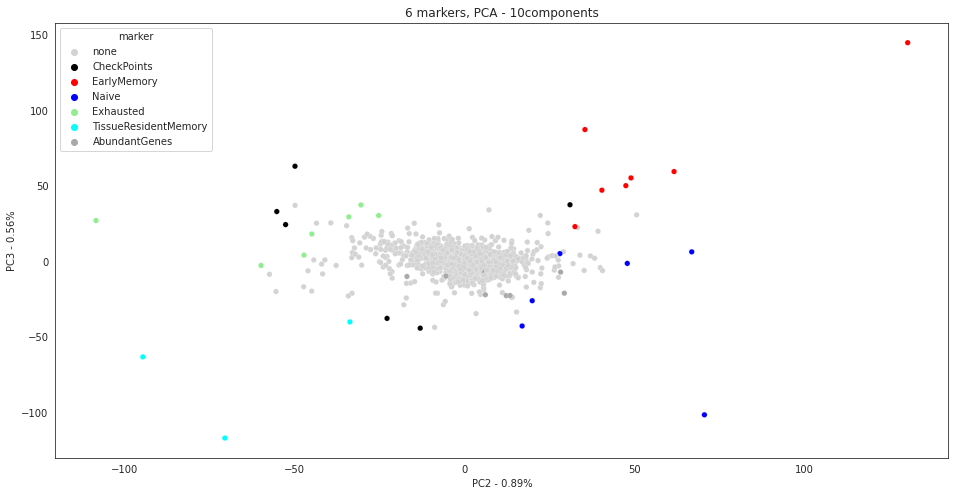

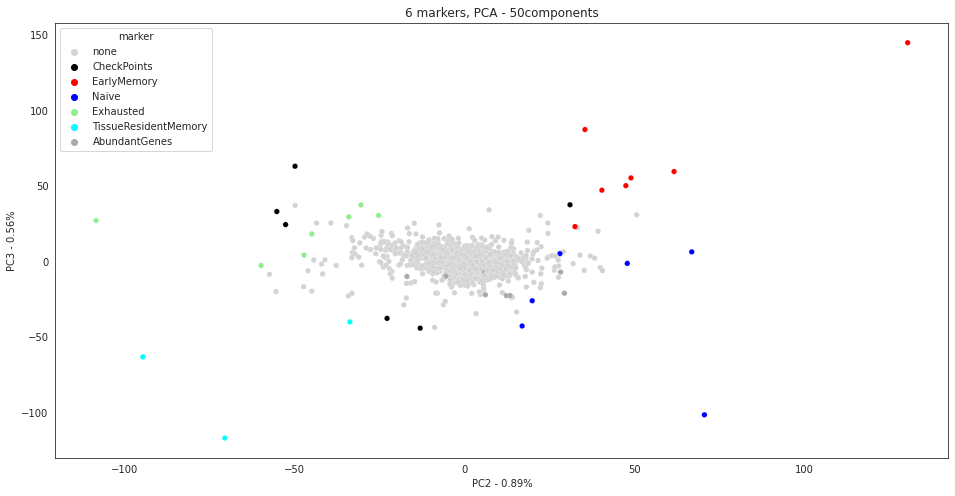

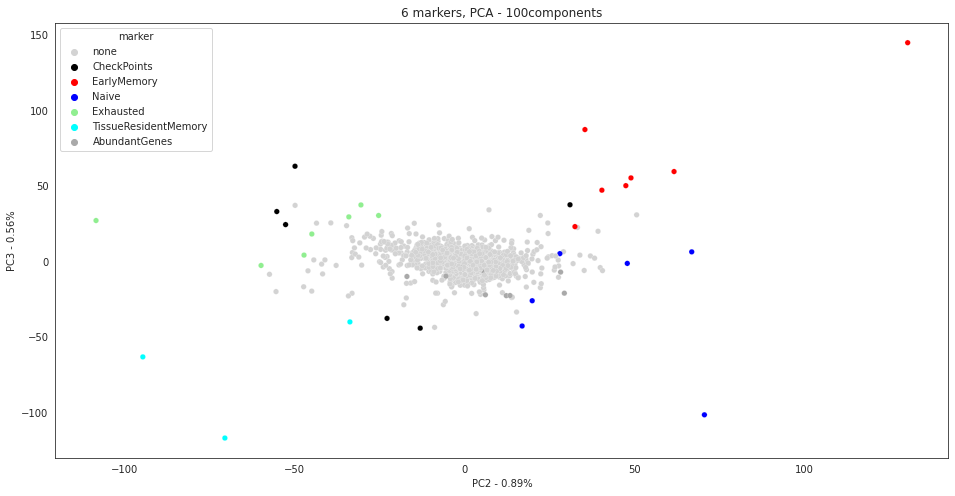

Dataset NSCLC. 
Running PCA analysis data preparation for 7 markers
(23459, 2184)
Thresholds used: (0.72, 2.1)
Dataset shape:  (23459, 2184)
x_labels shape (23459,) x_markers shape (23459,)
Markers values: 
 none                    23410
AbundantGenes               9
EarlyMemory                 7
Exhausted                   7
CheckPoints                 6
Naive                       6
TEM                         5
CirculatingMemory           4
TissueResidentMemory        3
Cycling                     2
Name: marker, dtype: int64
X for PCA shape:  (23459, 2184)
variance table        Mean       Std  gene
0  0.840144  1.880256  A1BG
1  0.008952  0.212967  NAT2
2  2.344212  3.780558   ADA
3  0.002866  0.062286  CDH2
4  0.731343  1.948894  AKT3
variance tables shape (23459, 3)
**********************************************************************
Training set shape (2309, 2184)
Adding markers (check if they were deleted)
**********************************************************************

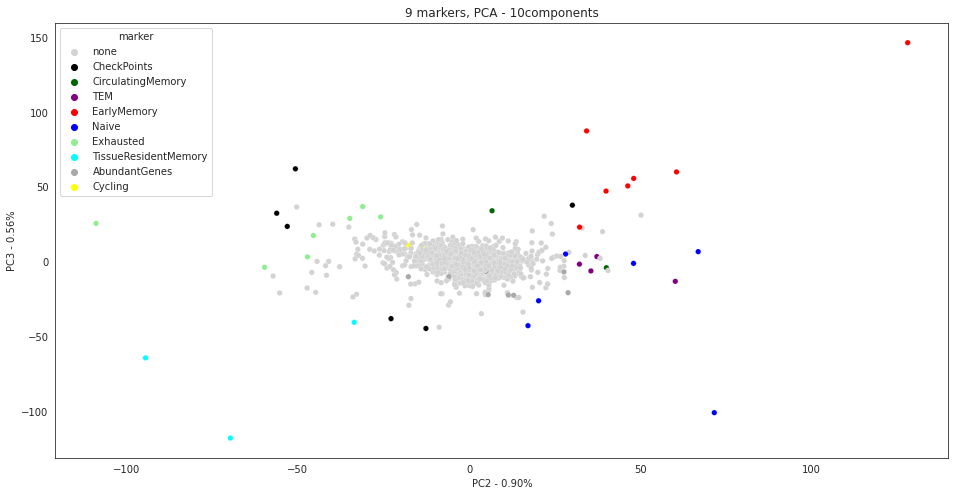

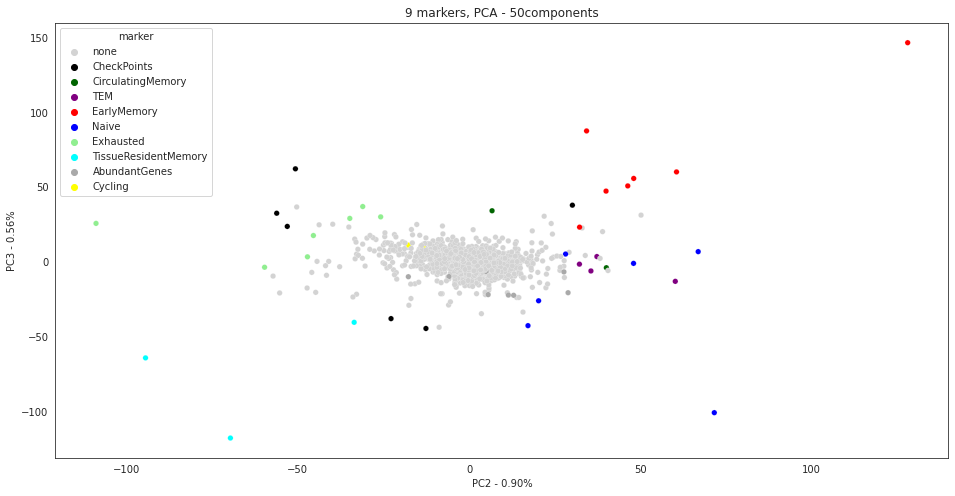

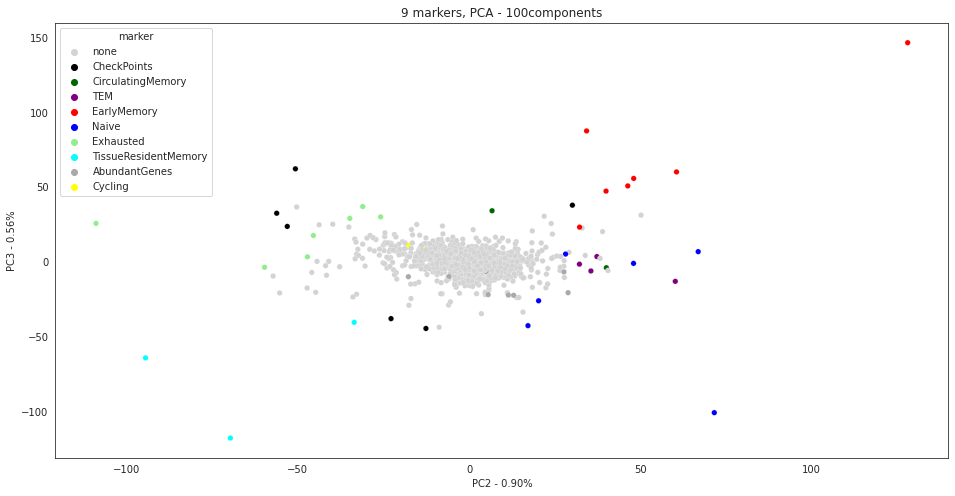

Dataset crc2. 
Running PCA analysis data preparation for 4 markers
(23459, 3709)
Thresholds used: (0.8, 1.9)
Dataset shape:  (23459, 3709)
x_labels shape (23459,) x_markers shape (23459,)
Markers values: 
 none                    23421
AbundantGenes               9
EarlyMemory                 7
Exhausted                   7
CheckPoints                 6
Naive                       6
TissueResidentMemory        3
Name: marker, dtype: int64
X for PCA shape:  (23459, 3709)
variance table        Mean       Std  gene
0  0.851640  1.874990  A1BG
1  0.007163  0.187887  NAT2
2  2.798874  3.905139   ADA
3  0.009786  0.197484  CDH2
4  0.830627  1.955720  AKT3
variance tables shape (23459, 3)
**********************************************************************
Training set shape (2382, 3709)
Adding markers (check if they were deleted)
**********************************************************************
Found gene that was absent. Adding it... CD96
Found gene that was absent. Adding it... CCR7

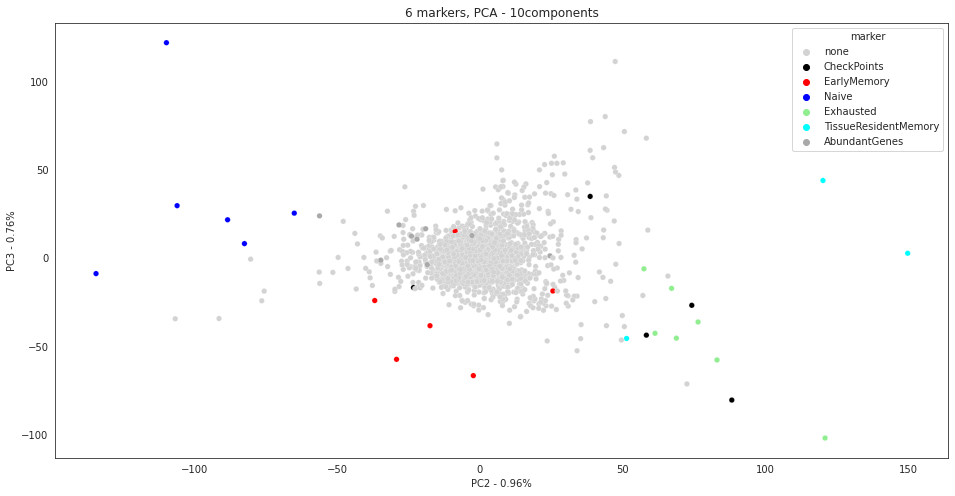

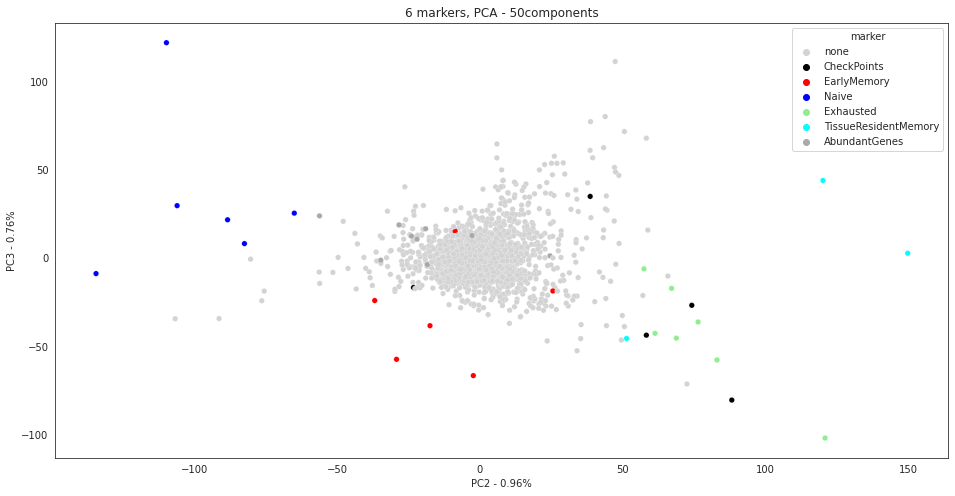

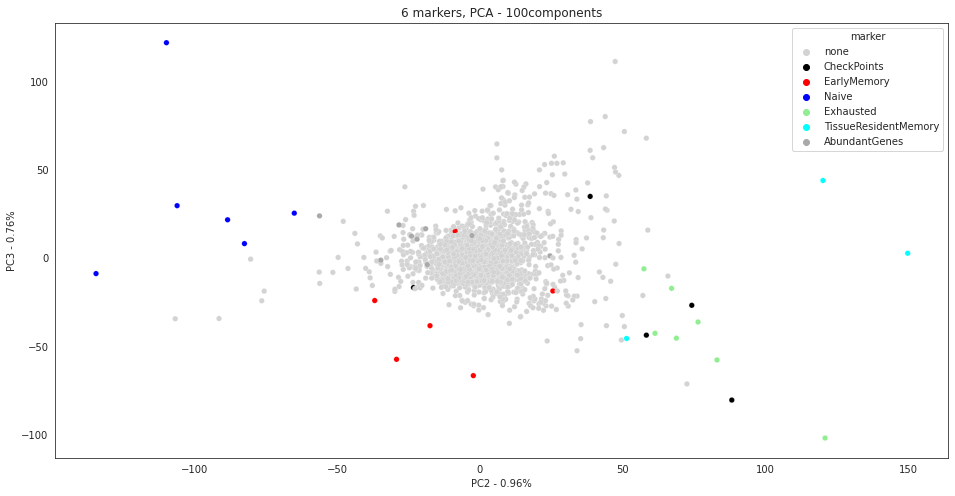

Dataset crc2. 
Running PCA analysis data preparation for 7 markers
(23459, 3709)
Thresholds used: (0.8, 1.9)
Dataset shape:  (23459, 3709)
x_labels shape (23459,) x_markers shape (23459,)
Markers values: 
 none                    23410
AbundantGenes               9
EarlyMemory                 7
Exhausted                   7
CheckPoints                 6
Naive                       6
TEM                         5
CirculatingMemory           4
TissueResidentMemory        3
Cycling                     2
Name: marker, dtype: int64
X for PCA shape:  (23459, 3709)
variance table        Mean       Std  gene
0  0.851640  1.874990  A1BG
1  0.007163  0.187887  NAT2
2  2.798874  3.905139   ADA
3  0.009786  0.197484  CDH2
4  0.830627  1.955720  AKT3
variance tables shape (23459, 3)
**********************************************************************
Training set shape (2382, 3709)
Adding markers (check if they were deleted)
**********************************************************************
F

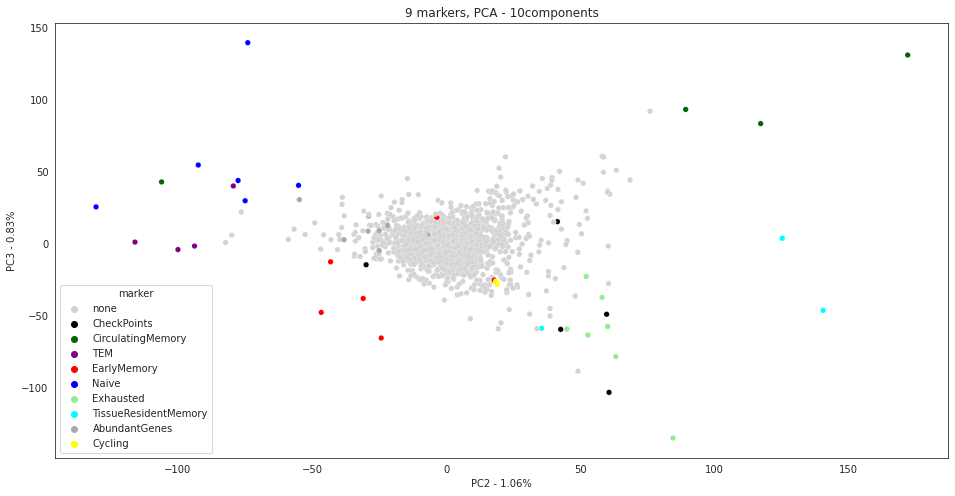

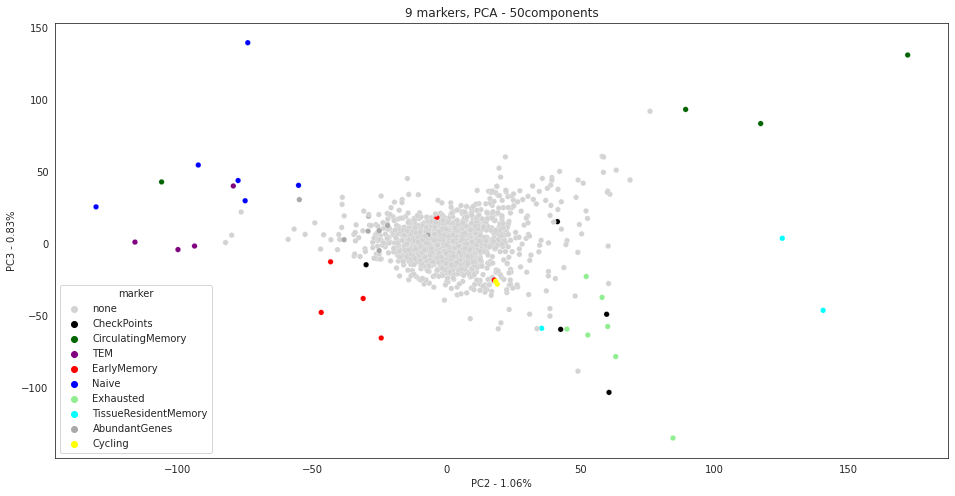

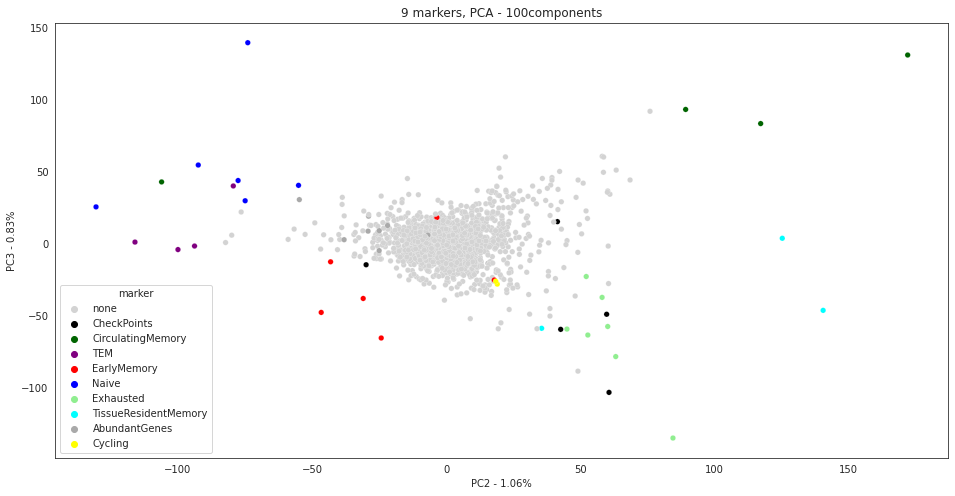

Dataset hepa. 
Running PCA analysis data preparation for 4 markers
(23459, 1635)
Thresholds used: (0.849, 1.9)
Dataset shape:  (23459, 1635)
x_labels shape (23459,) x_markers shape (23459,)
Markers values: 
 none                    23421
AbundantGenes               9
EarlyMemory                 7
Exhausted                   7
CheckPoints                 6
Naive                       6
TissueResidentMemory        3
Name: marker, dtype: int64
X for PCA shape:  (23459, 1635)
variance table        Mean       Std  gene
0  1.017785  2.087081  A1BG
1  0.008233  0.169532  NAT2
2  2.712335  4.008025   ADA
3  0.026240  0.356761  CDH2
4  0.733004  1.912688  AKT3
variance tables shape (23459, 3)
**********************************************************************
Training set shape (2390, 1635)
Adding markers (check if they were deleted)
**********************************************************************
Found gene that was absent. Adding it... CD96
Found gene that was absent. Adding it... LA

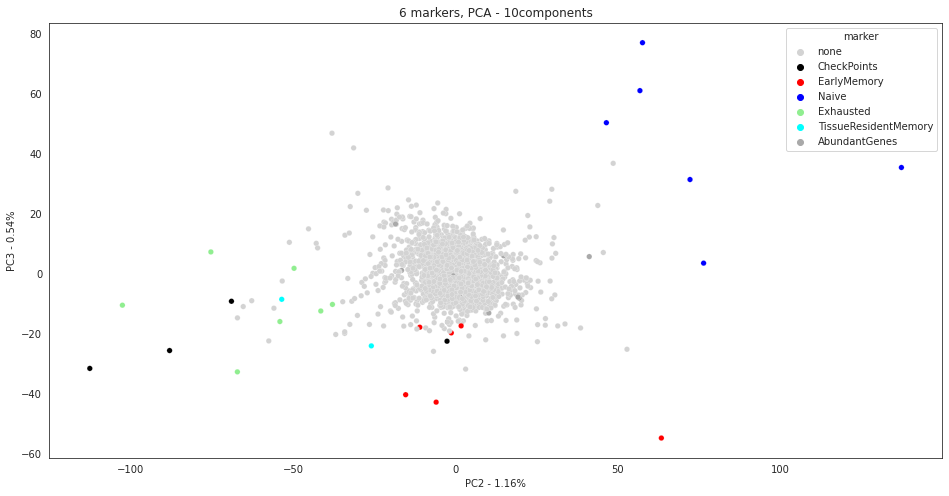

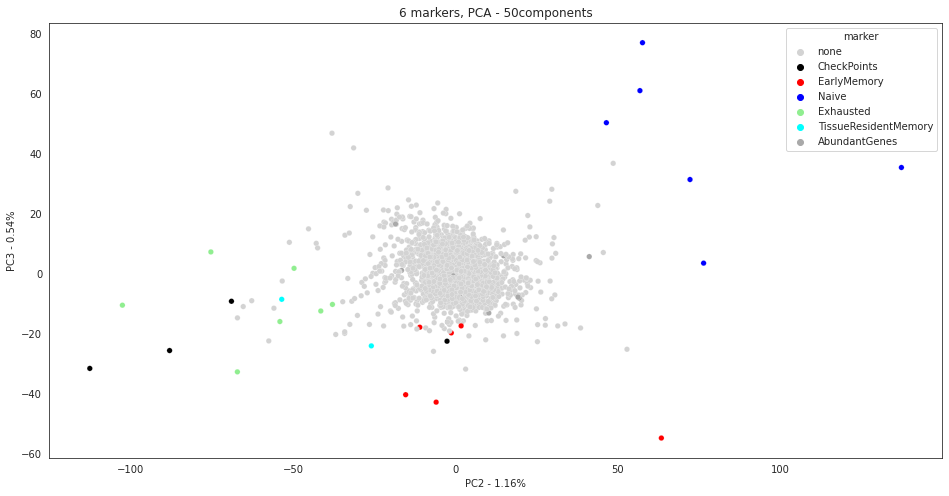

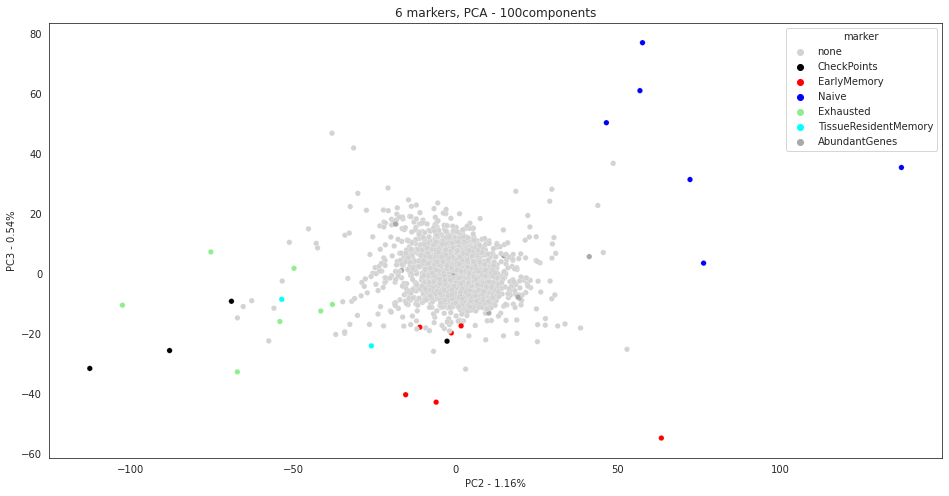

Dataset hepa. 
Running PCA analysis data preparation for 7 markers
(23459, 1635)
Thresholds used: (0.849, 1.9)
Dataset shape:  (23459, 1635)
x_labels shape (23459,) x_markers shape (23459,)
Markers values: 
 none                    23410
AbundantGenes               9
EarlyMemory                 7
Exhausted                   7
CheckPoints                 6
Naive                       6
TEM                         5
CirculatingMemory           4
TissueResidentMemory        3
Cycling                     2
Name: marker, dtype: int64
X for PCA shape:  (23459, 1635)
variance table        Mean       Std  gene
0  1.017785  2.087081  A1BG
1  0.008233  0.169532  NAT2
2  2.712335  4.008025   ADA
3  0.026240  0.356761  CDH2
4  0.733004  1.912688  AKT3
variance tables shape (23459, 3)
**********************************************************************
Training set shape (2390, 1635)
Adding markers (check if they were deleted)
**********************************************************************

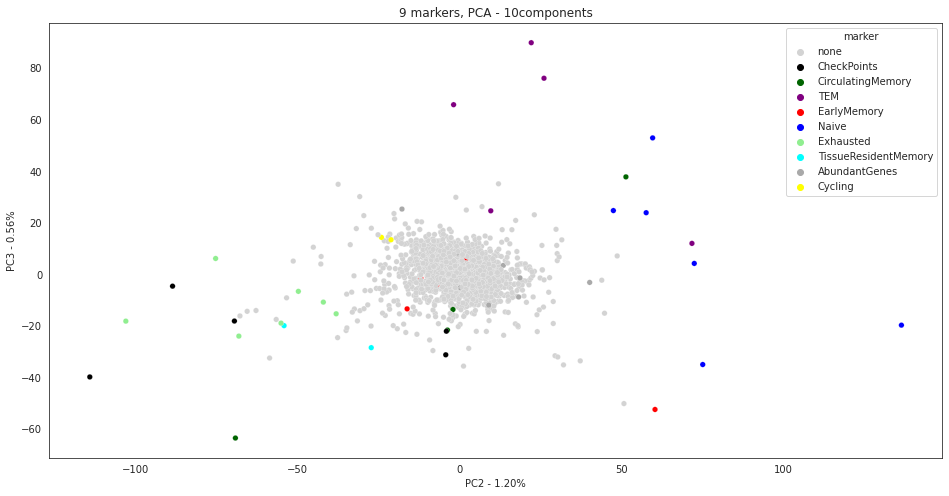

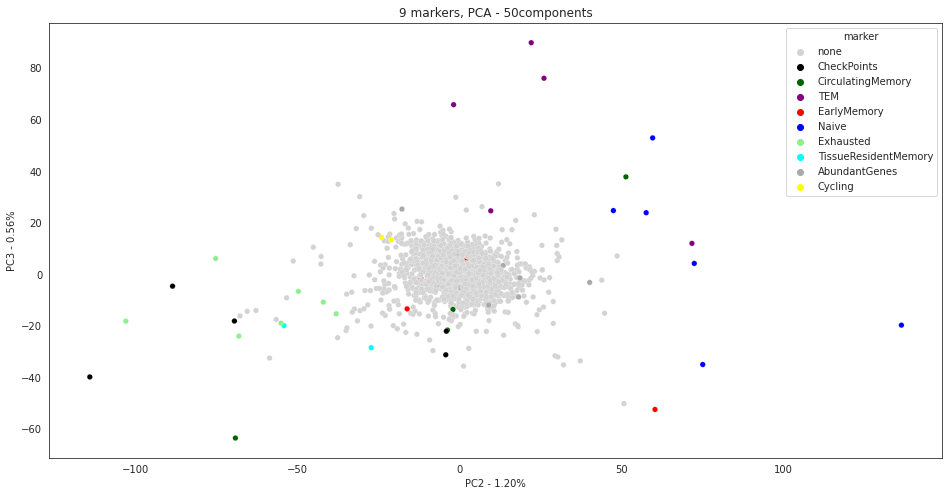

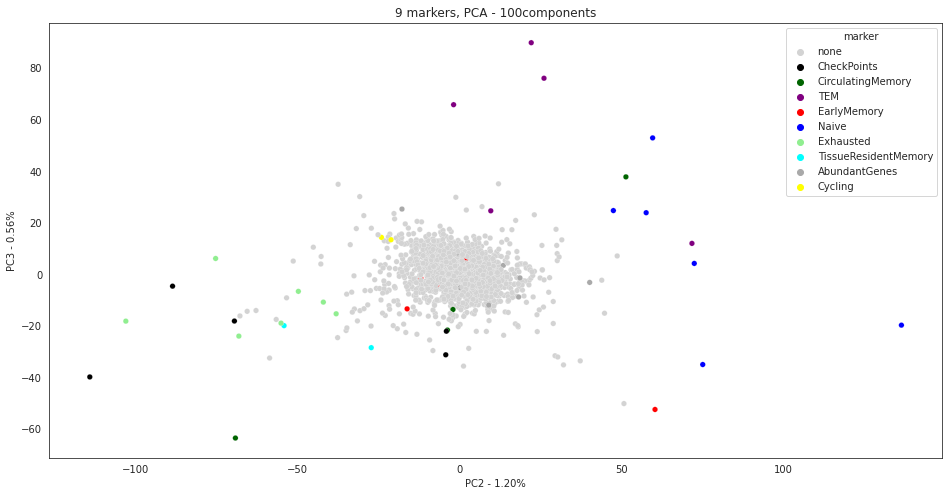

In [ ]:
pca_dict = PCA_run(csv_save=False, pca_UMAP=False)

In [ ]:
for key in pca_dict:
  for data in pca_dict[key]:
    print(key, data.shape)

NSCLC_4 (2342, 2184)
NSCLC_4 (2342, 102)
NSCLC_4 (100,)
NSCLC_7 (2348, 2184)
NSCLC_7 (2348, 102)
NSCLC_7 (100,)
crc2_4 (2415, 3709)
crc2_4 (2415, 102)
crc2_4 (100,)
crc2_7 (2423, 3709)
crc2_7 (2423, 102)
crc2_7 (100,)
hepa_4 (2419, 1635)
hepa_4 (2419, 102)
hepa_4 (100,)
hepa_7 (2428, 1635)
hepa_7 (2428, 102)
hepa_7 (100,)


In [ ]:
for key in pca_dict.keys():
  dataset_name= key.split('_')[0]
  print(dataset_name, 'shape: ', pca_dict[key][1].shape)
  mrkrs = key.split('_')[1]
  name_file= dataset_name +'_' + mrkrs + '_PCA_100' + '_' + datetime.now().strftime("%d-%m") + '.csv'
  pca_dict[key][1].to_csv(os.path.join(home_path, name_file))


NSCLC shape:  (2342, 102)
NSCLC shape:  (2348, 102)
crc2 shape:  (2415, 102)
crc2 shape:  (2423, 102)
hepa shape:  (2419, 102)
hepa shape:  (2428, 102)


#### Preparing NN data --> saving all the results to dictionary

In [ ]:
def NN_run(df_dict, csv_save=False):
  '''
  Runs NN 
  '''
  encod_dict = {}
  for key in df_dict.keys():
    dataset_name = key[:-2]
    print(f'Running the Neural Network on the same params: {key[:-2]}, {key[-1]} markers')
    if key[-1] == '4': 
        color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                              'EarlyMemory': 'red', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
        markers = markers_four
        main_markers = {k: v for k, v in markers_four.items() if k not in ['AbundantGenes', 'CheckPoints']}
    else:
        color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                              'EarlyMemory': 'red','TEM': 'purple','CirculatingMemory': 'darkgreen',
                              'Cycling': 'yellow', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
        markers = markers_last
        main_markers = {k: v for k, v in markers_last.items() if k not in ['AbundantGenes', 'CheckPoints']}

    for dim_size in dims:
      training_set = df_dict[key][0] #saved training set 
      key_dict = dataset_name + '_' + str(len(markers)) + '_' + str(dim_size)
      model, X_nn, gene_labels_fin, gene_markers_fin = data_prep_train_for_NN(training_set=training_set, n_dim=dim_size, n_epochs=n_epochs, batch_size=batch_size)
      encodings = test_NN_print_result(model, X_nn, gene_labels_fin, gene_markers_fin, dim_size, batch_size=batch_size)
      encod_dict[key_dict] = [encodings, gene_labels_fin, gene_markers_fin]
      title = 'UMAP of NN-' + str(dim_size) + ' results ' + str(len(markers)) + ' markers'
      umap_embedding(encodings, gene_labels_fin, gene_markers_fin, color_marker, title)
    
  return encod_dict


Running the Neural Network on the same params: NSCLC, 4 markers
**********************************************************************
Modeling for 10 dimensions
Shape of the dataset for the modelling: (2342, 2182)
Shape of the train set: (2107, 2182), shape of the validation set (235, 2182)
Number of features for the train: 2182
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=2182, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=10, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=10, out_features

 10%|█         | 10/100 [00:08<01:12,  1.24it/s]

Epoch 10: train loss 7.651784807443619; valid loss 7.751857916514079


 20%|██        | 20/100 [00:13<00:41,  1.91it/s]

Epoch 20: train loss 7.341306433081627; valid loss 7.213483810424805


 30%|███       | 30/100 [00:19<00:36,  1.94it/s]

Epoch 30: train loss 7.095362976193428; valid loss 7.027148246765137


 40%|████      | 40/100 [00:24<00:30,  1.94it/s]

Epoch 40: train loss 6.775539875030518; valid loss 6.937124729156494


 50%|█████     | 50/100 [00:29<00:26,  1.91it/s]

Epoch 50: train loss 6.325009778141975; valid loss 6.800373554229736


 60%|██████    | 60/100 [00:34<00:20,  1.94it/s]

Epoch 60: train loss 5.972649276256561; valid loss 6.27267599105835


 70%|███████   | 70/100 [00:39<00:15,  1.93it/s]

Epoch 70: train loss 5.851549223065376; valid loss 6.119425137837728


 80%|████████  | 80/100 [00:45<00:10,  1.90it/s]

Epoch 80: train loss 5.793842554092407; valid loss 5.978248278299968


 90%|█████████ | 90/100 [00:50<00:05,  1.77it/s]

Epoch 90: train loss 5.797440379858017; valid loss 6.139898935953776


100%|██████████| 100/100 [00:56<00:00,  1.78it/s]

Epoch 100: train loss 5.7698826640844345; valid loss 5.9317606290181475


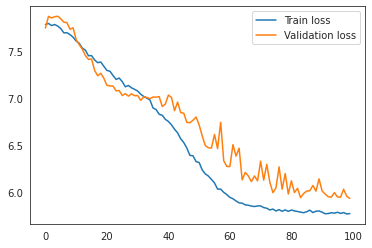

Encoding shape: (2342, 10)


/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning:

The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.



(2342, 2)
(2342, 10) (2342,) (2342,)


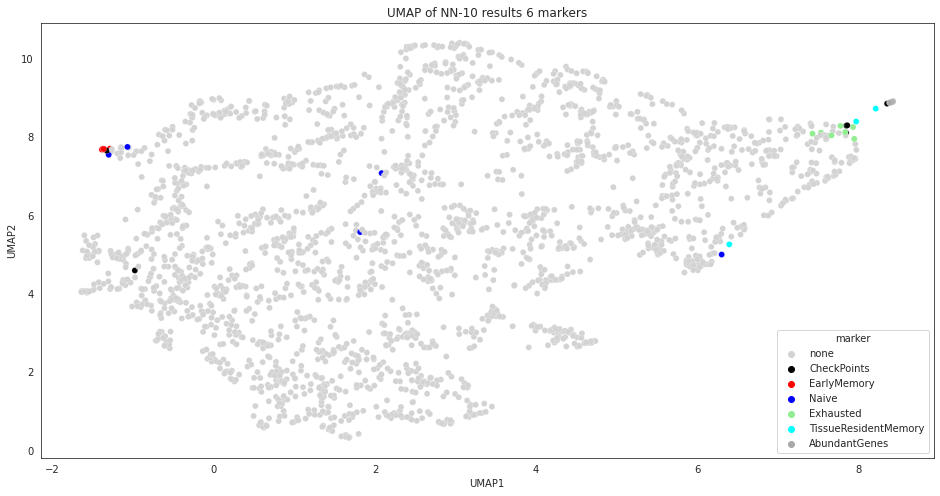

**********************************************************************
Modeling for 50 dimensions
Shape of the dataset for the modelling: (2342, 2182)
Shape of the train set: (2107, 2182), shape of the validation set (235, 2182)
Number of features for the train: 2182
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=2182, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=50, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=50, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
  

 10%|█         | 10/100 [00:05<00:47,  1.88it/s]

Epoch 10: train loss 7.680696606636047; valid loss 7.716229438781738


 20%|██        | 20/100 [00:10<00:43,  1.82it/s]

Epoch 20: train loss 7.39373505115509; valid loss 7.367776075998942


 30%|███       | 30/100 [00:16<00:38,  1.84it/s]

Epoch 30: train loss 7.068735525012016; valid loss 7.007075309753418


 40%|████      | 40/100 [00:21<00:32,  1.85it/s]

Epoch 40: train loss 6.664345994591713; valid loss 6.783212502797444


 50%|█████     | 50/100 [00:26<00:26,  1.87it/s]

Epoch 50: train loss 6.203720673918724; valid loss 6.536123593648274


 60%|██████    | 60/100 [00:32<00:21,  1.84it/s]

Epoch 60: train loss 5.854487180709839; valid loss 6.147383371988933


 70%|███████   | 70/100 [00:37<00:16,  1.86it/s]

Epoch 70: train loss 5.741226866841316; valid loss 6.120852152506511


 80%|████████  | 80/100 [00:44<00:11,  1.67it/s]

Epoch 80: train loss 5.6691731959581375; valid loss 5.8658192952473955


 90%|█████████ | 90/100 [00:49<00:05,  1.82it/s]

Epoch 90: train loss 5.631744101643562; valid loss 5.906697909037272


100%|██████████| 100/100 [00:55<00:00,  1.81it/s]

Epoch 100: train loss 5.602785751223564; valid loss 5.849140326182048


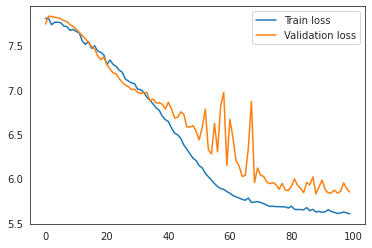

Encoding shape: (2342, 50)
(2342, 2)
(2342, 50) (2342,) (2342,)


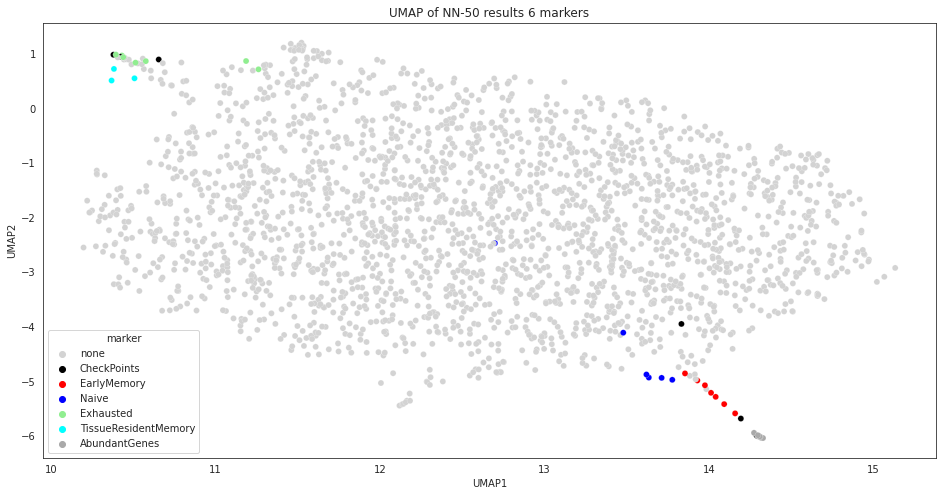

**********************************************************************
Modeling for 100 dimensions
Shape of the dataset for the modelling: (2342, 2182)
Shape of the train set: (2107, 2182), shape of the validation set (235, 2182)
Number of features for the train: 2182
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=2182, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=100, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=100, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01

 10%|█         | 10/100 [00:05<00:50,  1.78it/s]

Epoch 10: train loss 7.612159192562103; valid loss 7.737283706665039


 20%|██        | 20/100 [00:11<00:45,  1.75it/s]

Epoch 20: train loss 7.3495878130197525; valid loss 7.27430534362793


 30%|███       | 30/100 [00:17<00:40,  1.75it/s]

Epoch 30: train loss 7.016572251915932; valid loss 7.018532435099284


 40%|████      | 40/100 [00:22<00:34,  1.72it/s]

Epoch 40: train loss 6.616375595331192; valid loss 6.881215572357178


 50%|█████     | 50/100 [00:28<00:28,  1.74it/s]

Epoch 50: train loss 6.104852765798569; valid loss 6.430912971496582


 60%|██████    | 60/100 [00:34<00:23,  1.72it/s]

Epoch 60: train loss 5.794961109757423; valid loss 6.430294831593831


 70%|███████   | 70/100 [00:40<00:16,  1.78it/s]

Epoch 70: train loss 5.65300877392292; valid loss 6.292166392008464


 80%|████████  | 80/100 [00:45<00:11,  1.69it/s]

Epoch 80: train loss 5.602113112807274; valid loss 5.96290906270345


 90%|█████████ | 90/100 [00:51<00:05,  1.69it/s]

Epoch 90: train loss 5.543449550867081; valid loss 5.8580013910929365


100%|██████████| 100/100 [00:57<00:00,  1.73it/s]

Epoch 100: train loss 5.527062803506851; valid loss 5.827029863993327


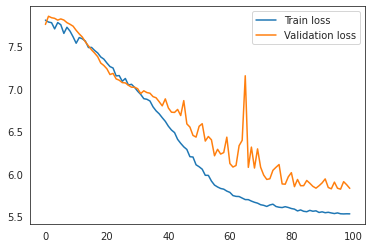

Encoding shape: (2342, 100)
(2342, 2)
(2342, 100) (2342,) (2342,)


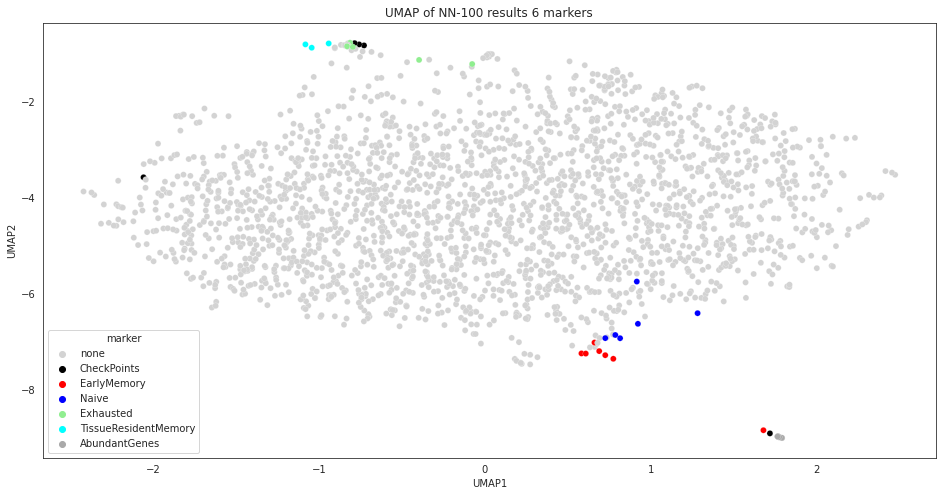

Running the Neural Network on the same params: NSCLC, 7 markers
**********************************************************************
Modeling for 10 dimensions
Shape of the dataset for the modelling: (2348, 2182)
Shape of the train set: (2113, 2182), shape of the validation set (235, 2182)
Number of features for the train: 2182
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=2182, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=10, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=10, out_features

 10%|█         | 10/100 [00:05<00:52,  1.72it/s]

Epoch 10: train loss 7.5867196140867295; valid loss 7.8163371086120605


 20%|██        | 20/100 [00:12<00:57,  1.39it/s]

Epoch 20: train loss 7.268682754401005; valid loss 7.163056055704753


 30%|███       | 30/100 [00:18<00:40,  1.71it/s]

Epoch 30: train loss 7.028548341808897; valid loss 6.990576267242432


 40%|████      | 40/100 [00:24<00:34,  1.72it/s]

Epoch 40: train loss 6.688096740029075; valid loss 6.861068566640218


 50%|█████     | 50/100 [00:29<00:28,  1.73it/s]

Epoch 50: train loss 6.248874071872596; valid loss 6.644823710123698


 60%|██████    | 60/100 [00:35<00:22,  1.74it/s]

Epoch 60: train loss 5.910746227611195; valid loss 6.373302300771077


 70%|███████   | 70/100 [00:41<00:17,  1.73it/s]

Epoch 70: train loss 5.810078418616093; valid loss 6.0585988362630205


 80%|████████  | 80/100 [00:47<00:11,  1.73it/s]

Epoch 80: train loss 5.776611024683172; valid loss 5.981320858001709


 90%|█████████ | 90/100 [00:52<00:05,  1.72it/s]

Epoch 90: train loss 5.760174520087965; valid loss 6.172175884246826


100%|██████████| 100/100 [00:58<00:00,  1.70it/s]

Epoch 100: train loss 5.754155491337632; valid loss 6.059019883473714


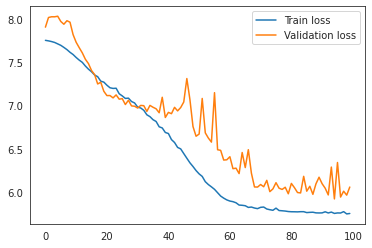

Encoding shape: (2348, 10)
(2348, 2)
(2348, 10) (2348,) (2348,)


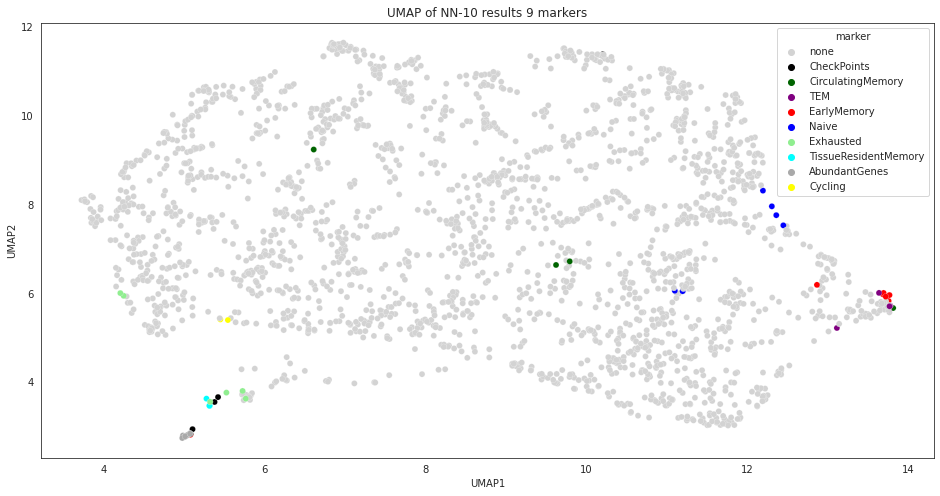

**********************************************************************
Modeling for 50 dimensions
Shape of the dataset for the modelling: (2348, 2182)
Shape of the train set: (2113, 2182), shape of the validation set (235, 2182)
Number of features for the train: 2182
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=2182, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=50, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=50, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
  

 10%|█         | 10/100 [00:05<00:53,  1.69it/s]

Epoch 10: train loss 7.636466878833192; valid loss 7.900289058685303


 20%|██        | 20/100 [00:11<00:47,  1.70it/s]

Epoch 20: train loss 7.342093034224077; valid loss 7.348385651906331


 30%|███       | 30/100 [00:17<00:41,  1.69it/s]

Epoch 30: train loss 7.01437606233539; valid loss 6.981459776560466


 40%|████      | 40/100 [00:23<00:35,  1.69it/s]

Epoch 40: train loss 6.621853481639516; valid loss 6.853826999664307


 50%|█████     | 50/100 [00:29<00:29,  1.67it/s]

Epoch 50: train loss 6.116043755502412; valid loss 6.499027729034424


 60%|██████    | 60/100 [00:35<00:24,  1.66it/s]

Epoch 60: train loss 5.791571660475298; valid loss 6.104946454366048


 70%|███████   | 70/100 [00:41<00:17,  1.70it/s]

Epoch 70: train loss 5.6886273008404356; valid loss 6.142494837443034


 80%|████████  | 80/100 [00:47<00:11,  1.68it/s]

Epoch 80: train loss 5.643009677077785; valid loss 5.991713205973308


 90%|█████████ | 90/100 [00:53<00:05,  1.68it/s]

Epoch 90: train loss 5.616596453117602; valid loss 5.8293843269348145


100%|██████████| 100/100 [00:59<00:00,  1.68it/s]

Epoch 100: train loss 5.592253005865849; valid loss 5.877731482187907


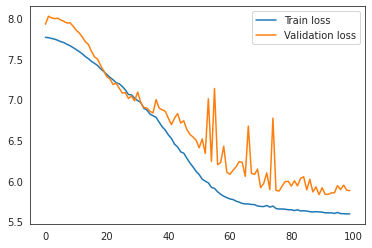

Encoding shape: (2348, 50)
(2348, 2)
(2348, 50) (2348,) (2348,)


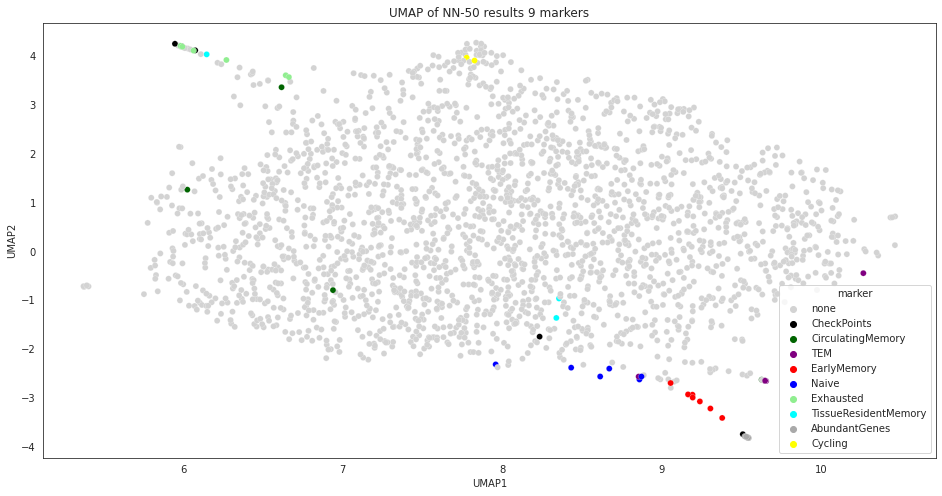

**********************************************************************
Modeling for 100 dimensions
Shape of the dataset for the modelling: (2348, 2182)
Shape of the train set: (2113, 2182), shape of the validation set (235, 2182)
Number of features for the train: 2182
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=2182, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=100, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=100, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01

 10%|█         | 10/100 [00:06<00:54,  1.66it/s]

Epoch 10: train loss 7.626113472562848; valid loss 7.878082116444905


 20%|██        | 20/100 [00:12<00:48,  1.64it/s]

Epoch 20: train loss 7.296515002395168; valid loss 7.338118712107341


 30%|███       | 30/100 [00:18<00:43,  1.63it/s]

Epoch 30: train loss 6.9720648996757735; valid loss 7.032277266184489


 40%|████      | 40/100 [00:24<00:35,  1.67it/s]

Epoch 40: train loss 6.5658031954909815; valid loss 6.811138312021892


 50%|█████     | 50/100 [00:30<00:30,  1.66it/s]

Epoch 50: train loss 6.059553637649074; valid loss 6.441397825876872


 60%|██████    | 60/100 [00:36<00:24,  1.62it/s]

Epoch 60: train loss 5.739707412141742; valid loss 6.1461531321207685


 70%|███████   | 70/100 [00:42<00:18,  1.64it/s]

Epoch 70: train loss 5.625410296700218; valid loss 5.898755709330241


 80%|████████  | 80/100 [00:48<00:12,  1.64it/s]

Epoch 80: train loss 5.575857480367024; valid loss 6.288340409596761


 90%|█████████ | 90/100 [00:55<00:06,  1.63it/s]

Epoch 90: train loss 5.535939332210656; valid loss 5.839598178863525


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]

Epoch 100: train loss 5.507260842756792; valid loss 5.8612949053446455


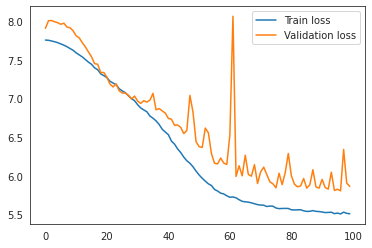

Encoding shape: (2348, 100)
(2348, 2)
(2348, 100) (2348,) (2348,)


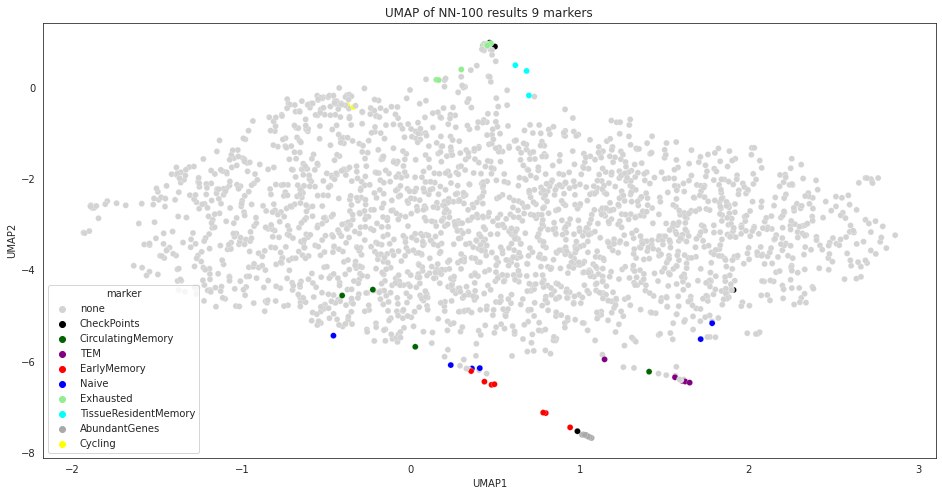

Running the Neural Network on the same params: crc2, 4 markers
**********************************************************************
Modeling for 10 dimensions
Shape of the dataset for the modelling: (2415, 3707)
Shape of the train set: (2173, 3707), shape of the validation set (242, 3707)
Number of features for the train: 3707
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=3707, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=10, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=10, out_features=

 10%|█         | 10/100 [00:06<00:58,  1.54it/s]

Epoch 10: train loss 8.29941937417695; valid loss 7.704168478647868


 20%|██        | 20/100 [00:13<00:52,  1.51it/s]

Epoch 20: train loss 8.014045397440592; valid loss 7.6412069002787275


 30%|███       | 30/100 [00:19<00:46,  1.50it/s]

Epoch 30: train loss 7.814371036760734; valid loss 7.621812184651692


 40%|████      | 40/100 [00:26<00:39,  1.52it/s]

Epoch 40: train loss 7.4933797518412275; valid loss 7.492024103800456


 50%|█████     | 50/100 [00:32<00:32,  1.53it/s]

Epoch 50: train loss 7.041519641876221; valid loss 7.181812604268392


 60%|██████    | 60/100 [00:39<00:26,  1.50it/s]

Epoch 60: train loss 6.54070910540494; valid loss 6.7853701909383135


 70%|███████   | 70/100 [00:46<00:19,  1.52it/s]

Epoch 70: train loss 6.233809052091656; valid loss 6.440691947937012


 80%|████████  | 80/100 [00:52<00:13,  1.49it/s]

Epoch 80: train loss 6.160543730764678; valid loss 6.239443461100261


 90%|█████████ | 90/100 [00:59<00:06,  1.48it/s]

Epoch 90: train loss 6.140920769084584; valid loss 6.223919709523519


100%|██████████| 100/100 [01:06<00:00,  1.51it/s]

Epoch 100: train loss 6.119770656932484; valid loss 6.202785650889079


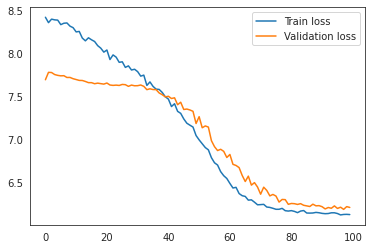

Encoding shape: (2415, 10)
(2415, 2)
(2415, 10) (2415,) (2415,)


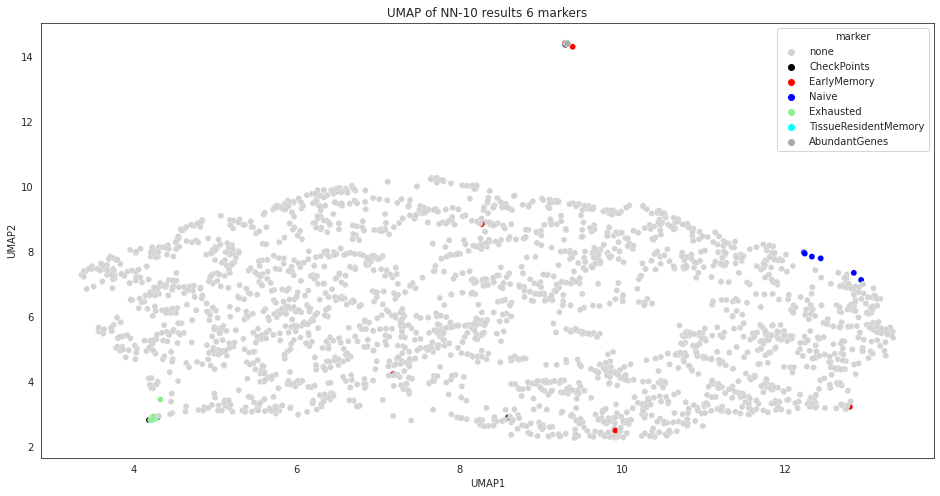

**********************************************************************
Modeling for 50 dimensions
Shape of the dataset for the modelling: (2415, 3707)
Shape of the train set: (2173, 3707), shape of the validation set (242, 3707)
Number of features for the train: 3707
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=3707, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=50, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=50, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
  

 10%|█         | 10/100 [00:07<01:06,  1.35it/s]

Epoch 10: train loss 8.2956774596012; valid loss 7.708776315053304


 20%|██        | 20/100 [00:14<00:56,  1.41it/s]

Epoch 20: train loss 8.00421479254058; valid loss 7.647196928660075


 30%|███       | 30/100 [00:21<00:50,  1.39it/s]

Epoch 30: train loss 7.739795858209783; valid loss 7.617664337158203


 40%|████      | 40/100 [00:28<00:42,  1.41it/s]

Epoch 40: train loss 7.4139925494338526; valid loss 7.53756316502889


 50%|█████     | 50/100 [00:36<00:35,  1.40it/s]

Epoch 50: train loss 6.915929259675922; valid loss 7.090058008829753


 60%|██████    | 60/100 [00:43<00:28,  1.41it/s]

Epoch 60: train loss 6.486736283157811; valid loss 6.815714359283447


 70%|███████   | 70/100 [00:50<00:21,  1.42it/s]

Epoch 70: train loss 6.163656148043546; valid loss 6.35506534576416


 80%|████████  | 80/100 [00:57<00:13,  1.44it/s]

Epoch 80: train loss 6.085031942887739; valid loss 6.270630359649658


 90%|█████████ | 90/100 [01:04<00:07,  1.43it/s]

Epoch 90: train loss 6.065553665161133; valid loss 6.214411894480388


100%|██████████| 100/100 [01:11<00:00,  1.40it/s]

Epoch 100: train loss 6.019667365334251; valid loss 6.185550371805827


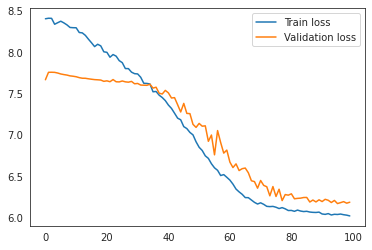

Encoding shape: (2415, 50)
(2415, 2)
(2415, 50) (2415,) (2415,)


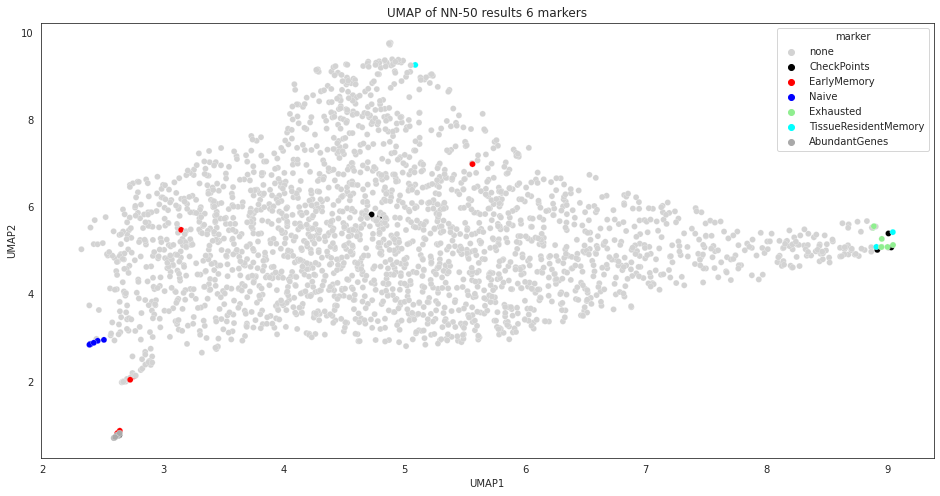

**********************************************************************
Modeling for 100 dimensions
Shape of the dataset for the modelling: (2415, 3707)
Shape of the train set: (2173, 3707), shape of the validation set (242, 3707)
Number of features for the train: 3707
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=3707, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=100, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=100, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01

 10%|█         | 10/100 [00:07<01:03,  1.43it/s]

Epoch 10: train loss 8.213692737348152; valid loss 7.749078591664632


 20%|██        | 20/100 [00:14<00:55,  1.44it/s]

Epoch 20: train loss 8.04879805535981; valid loss 7.669328848520915


 30%|███       | 30/100 [00:21<00:49,  1.42it/s]

Epoch 30: train loss 7.737169468041622; valid loss 7.5849223136901855


 40%|████      | 40/100 [00:28<00:42,  1.43it/s]

Epoch 40: train loss 7.373414328604033; valid loss 7.428036530812581


 50%|█████     | 50/100 [00:35<00:34,  1.43it/s]

Epoch 50: train loss 6.878447287010424; valid loss 7.074295361836751


 60%|██████    | 60/100 [00:42<00:28,  1.41it/s]

Epoch 60: train loss 6.363653717619; valid loss 6.556383450826009


 70%|███████   | 70/100 [00:49<00:21,  1.42it/s]

Epoch 70: train loss 6.097659530061664; valid loss 6.257194519042969


 80%|████████  | 80/100 [00:56<00:14,  1.40it/s]

Epoch 80: train loss 6.025874947056626; valid loss 6.15721066792806


 90%|█████████ | 90/100 [01:03<00:07,  1.41it/s]

Epoch 90: train loss 5.994178049492113; valid loss 6.145997206370036


100%|██████████| 100/100 [01:10<00:00,  1.42it/s]

Epoch 100: train loss 5.970480037458016; valid loss 6.119714419047038


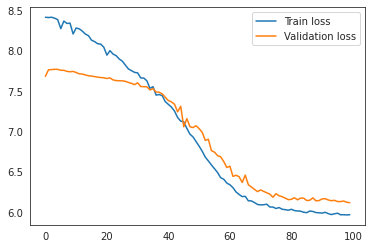

Encoding shape: (2415, 100)
(2415, 2)
(2415, 100) (2415,) (2415,)


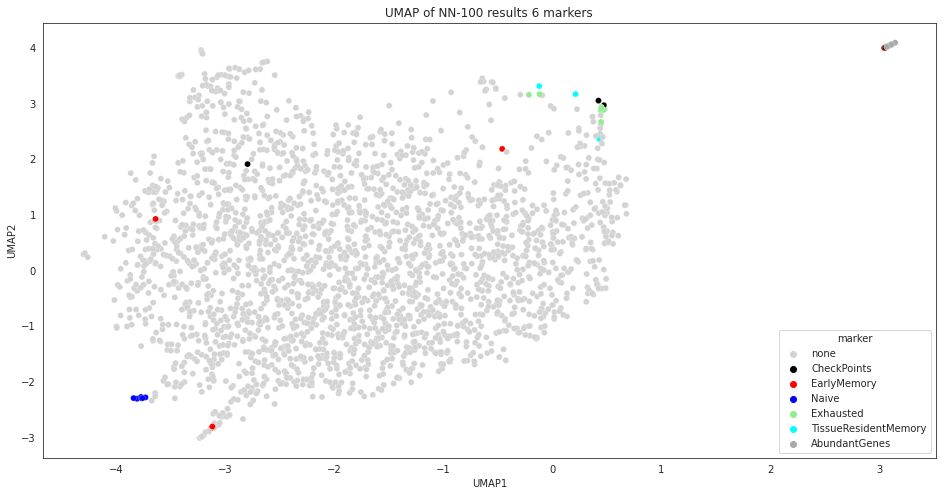

Running the Neural Network on the same params: crc2, 7 markers
**********************************************************************
Modeling for 10 dimensions
Shape of the dataset for the modelling: (2423, 3707)
Shape of the train set: (2180, 3707), shape of the validation set (243, 3707)
Number of features for the train: 3707
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=3707, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=10, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=10, out_features=

 10%|█         | 10/100 [00:07<01:04,  1.40it/s]

Epoch 10: train loss 8.282157393062816; valid loss 8.331976731618246


 20%|██        | 20/100 [00:14<00:57,  1.39it/s]

Epoch 20: train loss 8.033446999157176; valid loss 7.9279483159383135


 30%|███       | 30/100 [00:21<00:49,  1.40it/s]

Epoch 30: train loss 7.776081576066859; valid loss 7.6380666097005205


 40%|████      | 40/100 [00:28<00:43,  1.39it/s]

Epoch 40: train loss 7.484270825105555; valid loss 7.467357953389485


 50%|█████     | 50/100 [00:36<00:36,  1.38it/s]

Epoch 50: train loss 7.015289517009959; valid loss 7.214903195699056


 60%|██████    | 60/100 [00:43<00:28,  1.39it/s]

Epoch 60: train loss 6.509136171901927; valid loss 6.780933856964111


 70%|███████   | 70/100 [00:50<00:21,  1.38it/s]

Epoch 70: train loss 6.248088023241828; valid loss 6.445699532826741


 80%|████████  | 80/100 [00:57<00:14,  1.40it/s]

Epoch 80: train loss 6.179635328405044; valid loss 6.313180605570476


 90%|█████████ | 90/100 [01:05<00:07,  1.34it/s]

Epoch 90: train loss 6.152269461575677; valid loss 6.391274929046631


100%|██████████| 100/100 [01:12<00:00,  1.38it/s]

Epoch 100: train loss 6.13498604998869; valid loss 6.257777372996013


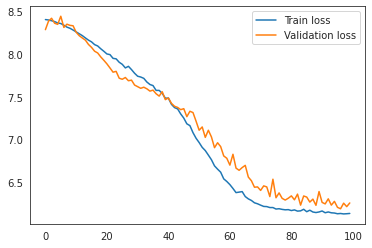

Encoding shape: (2423, 10)
(2423, 2)
(2423, 10) (2423,) (2423,)


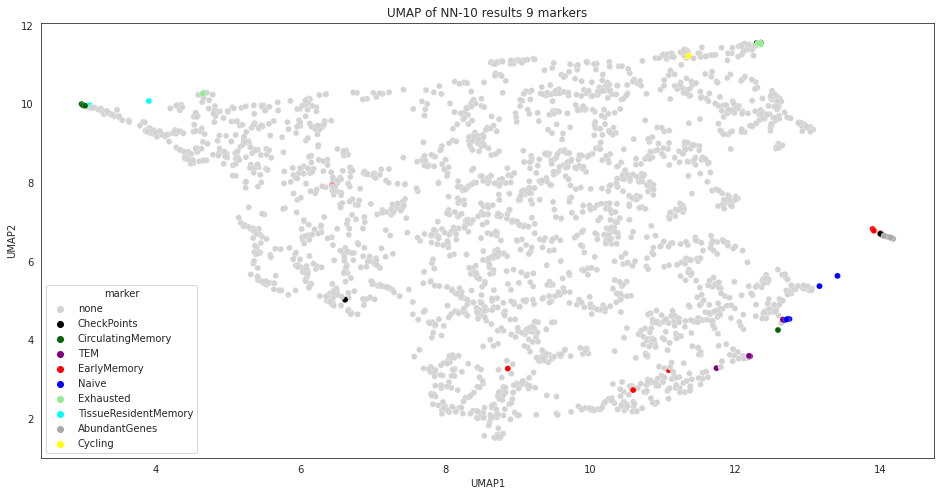

**********************************************************************
Modeling for 50 dimensions
Shape of the dataset for the modelling: (2423, 3707)
Shape of the train set: (2180, 3707), shape of the validation set (243, 3707)
Number of features for the train: 3707
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=3707, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=50, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=50, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
  

 10%|█         | 10/100 [00:07<01:06,  1.35it/s]

Epoch 10: train loss 8.30180653403787; valid loss 8.315985361735025


 20%|██        | 20/100 [00:15<00:59,  1.33it/s]

Epoch 20: train loss 8.075690339593326; valid loss 8.03971815109253


 30%|███       | 30/100 [00:22<00:52,  1.33it/s]

Epoch 30: train loss 7.769130173851462; valid loss 7.6879221598307295


 40%|████      | 40/100 [00:30<00:45,  1.32it/s]

Epoch 40: train loss 7.418386922163122; valid loss 7.5178554852803545


 50%|█████     | 50/100 [00:37<00:36,  1.36it/s]

Epoch 50: train loss 6.904175730312572; valid loss 7.186426480611165


 60%|██████    | 60/100 [00:45<00:29,  1.33it/s]

Epoch 60: train loss 6.4103822006898765; valid loss 7.1566189130147295


 70%|███████   | 70/100 [00:53<00:23,  1.27it/s]

Epoch 70: train loss 6.167433864930096; valid loss 6.534034252166748


 80%|████████  | 80/100 [01:00<00:15,  1.27it/s]

Epoch 80: train loss 6.103665646384744; valid loss 6.276743094126384


 90%|█████████ | 90/100 [01:08<00:07,  1.28it/s]

Epoch 90: train loss 6.061877124449786; valid loss 6.186416149139404


100%|██████████| 100/100 [01:16<00:00,  1.30it/s]

Epoch 100: train loss 6.03476461242227; valid loss 6.238961696624756


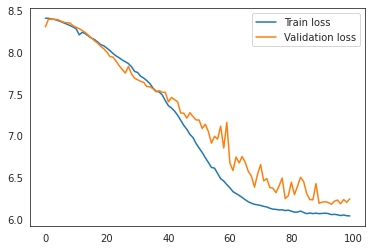

Encoding shape: (2423, 50)
(2423, 2)
(2423, 50) (2423,) (2423,)


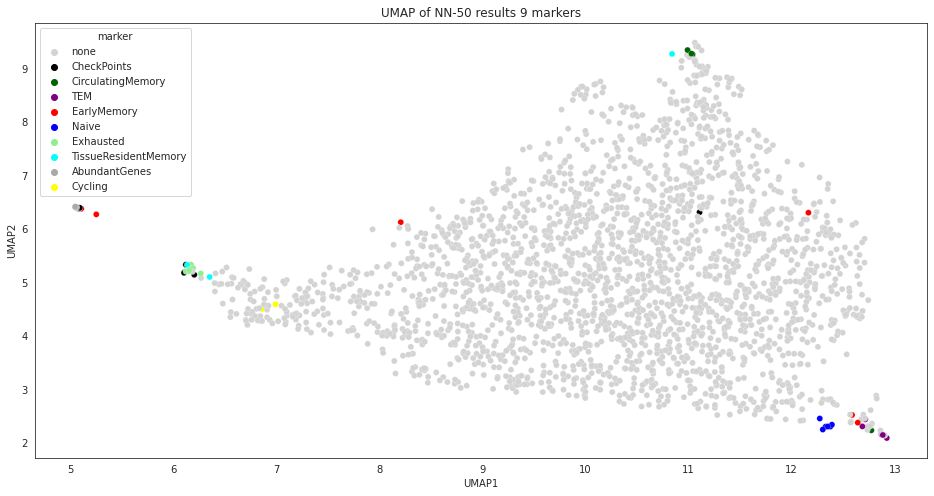

**********************************************************************
Modeling for 100 dimensions
Shape of the dataset for the modelling: (2423, 3707)
Shape of the train set: (2180, 3707), shape of the validation set (243, 3707)
Number of features for the train: 3707
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=3707, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=100, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=100, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01

 10%|█         | 10/100 [00:07<01:10,  1.28it/s]

Epoch 10: train loss 8.296855561873492; valid loss 8.311570644378662


 20%|██        | 20/100 [00:15<01:03,  1.27it/s]

Epoch 20: train loss 8.049933209138757; valid loss 8.026148319244385


 30%|███       | 30/100 [00:23<00:54,  1.29it/s]

Epoch 30: train loss 7.739988018484676; valid loss 7.654277165730794


 40%|████      | 40/100 [00:31<00:46,  1.28it/s]

Epoch 40: train loss 7.370603238835054; valid loss 7.395593166351318


 50%|█████     | 50/100 [00:39<00:39,  1.26it/s]

Epoch 50: train loss 6.834940784117755; valid loss 7.092449347178142


 60%|██████    | 60/100 [00:47<00:30,  1.31it/s]

Epoch 60: train loss 6.345232683069566; valid loss 6.813716729482015


 70%|███████   | 70/100 [00:54<00:23,  1.28it/s]

Epoch 70: train loss 6.125817733652451; valid loss 6.859201749165853


 80%|████████  | 80/100 [01:02<00:15,  1.29it/s]

Epoch 80: train loss 6.040956104502959; valid loss 6.294879118601481


 90%|█████████ | 90/100 [01:10<00:07,  1.29it/s]

Epoch 90: train loss 6.009884750141817; valid loss 6.3110725084940595


100%|██████████| 100/100 [01:18<00:00,  1.28it/s]

Epoch 100: train loss 5.986661602469051; valid loss 6.144998550415039


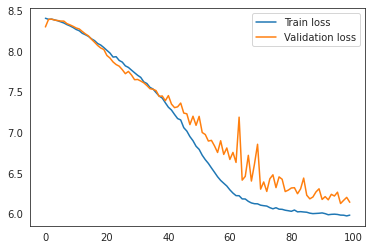

Encoding shape: (2423, 100)
(2423, 2)
(2423, 100) (2423,) (2423,)


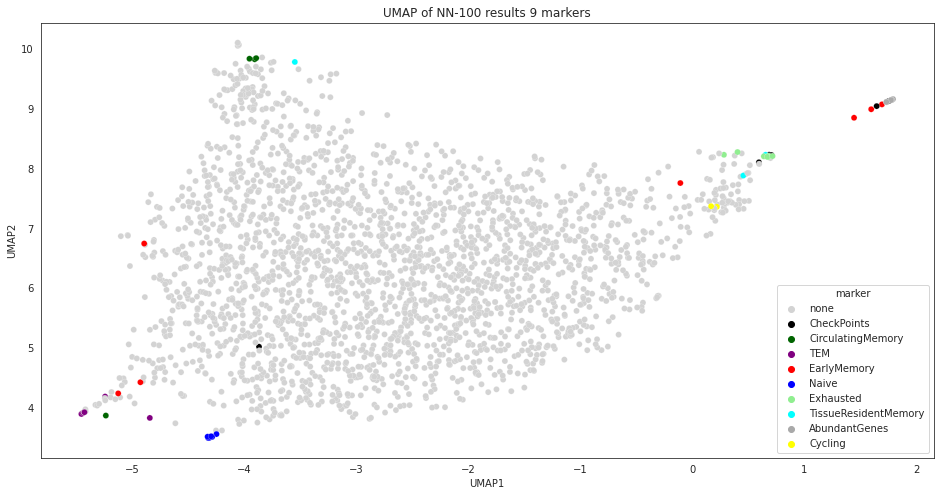

Running the Neural Network on the same params: hepa, 4 markers
**********************************************************************
Modeling for 10 dimensions
Shape of the dataset for the modelling: (2419, 1633)
Shape of the train set: (2177, 1633), shape of the validation set (242, 1633)
Number of features for the train: 1633
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=1633, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=10, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=10, out_features=

 10%|█         | 10/100 [00:07<01:03,  1.42it/s]

Epoch 10: train loss 8.877772317213172; valid loss 8.453879674275717


 20%|██        | 20/100 [00:14<00:57,  1.40it/s]

Epoch 20: train loss 8.487097529804005; valid loss 8.319188753763834


 30%|███       | 30/100 [00:21<00:49,  1.41it/s]

Epoch 30: train loss 8.041466376360725; valid loss 8.171665986378988


 40%|████      | 40/100 [00:28<00:42,  1.41it/s]

Epoch 40: train loss 7.360040861017564; valid loss 7.701551914215088


 50%|█████     | 50/100 [00:35<00:36,  1.39it/s]

Epoch 50: train loss 6.803517678204705; valid loss 7.047146320343018


 60%|██████    | 60/100 [00:42<00:28,  1.43it/s]

Epoch 60: train loss 6.646476717556224; valid loss 6.838588873545329


 70%|███████   | 70/100 [00:49<00:20,  1.44it/s]

Epoch 70: train loss 6.604597849004409; valid loss 6.753793080647786


 80%|████████  | 80/100 [00:56<00:14,  1.42it/s]

Epoch 80: train loss 6.5829152640174415; valid loss 6.751430193583171


 90%|█████████ | 90/100 [01:03<00:07,  1.42it/s]

Epoch 90: train loss 6.58237026719486; valid loss 6.732605934143066


100%|██████████| 100/100 [01:10<00:00,  1.41it/s]

Epoch 100: train loss 6.555953376433429; valid loss 6.718081951141357


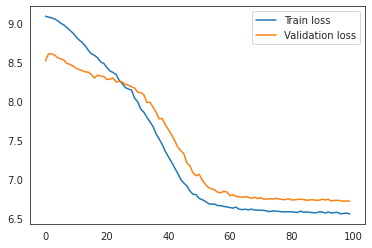

Encoding shape: (2419, 10)
(2419, 2)
(2419, 10) (2419,) (2419,)


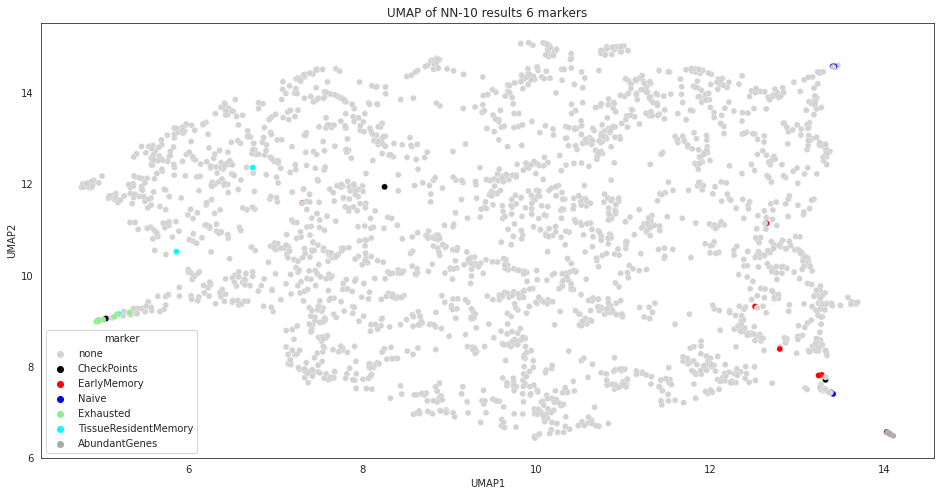

**********************************************************************
Modeling for 50 dimensions
Shape of the dataset for the modelling: (2419, 1633)
Shape of the train set: (2177, 1633), shape of the validation set (242, 1633)
Number of features for the train: 1633
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=1633, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=50, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=50, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
  

 10%|█         | 10/100 [00:07<01:05,  1.37it/s]

Epoch 10: train loss 8.919819761725034; valid loss 8.490785280863443


 20%|██        | 20/100 [00:14<00:58,  1.36it/s]

Epoch 20: train loss 8.490613741033217; valid loss 8.301555633544922


 30%|███       | 30/100 [00:22<00:51,  1.35it/s]

Epoch 30: train loss 7.9922974951127; valid loss 8.087409337361654


 40%|████      | 40/100 [00:29<00:43,  1.37it/s]

Epoch 40: train loss 7.2254999525406784; valid loss 7.630049705505371


 50%|█████     | 50/100 [00:36<00:36,  1.38it/s]

Epoch 50: train loss 6.617883920669556; valid loss 6.90356969833374


 60%|██████    | 60/100 [00:43<00:29,  1.37it/s]

Epoch 60: train loss 6.483444298014922; valid loss 6.6903502146403


 70%|███████   | 70/100 [00:51<00:21,  1.38it/s]

Epoch 70: train loss 6.426515200558831; valid loss 6.721416155497233


 80%|████████  | 80/100 [00:58<00:14,  1.37it/s]

Epoch 80: train loss 6.348860361996819; valid loss 6.64127238591512


 90%|█████████ | 90/100 [01:05<00:07,  1.37it/s]

Epoch 90: train loss 6.310226706897511; valid loss 6.630930264790853


100%|██████████| 100/100 [01:13<00:00,  1.37it/s]

Epoch 100: train loss 6.292538853252635; valid loss 6.61563507715861


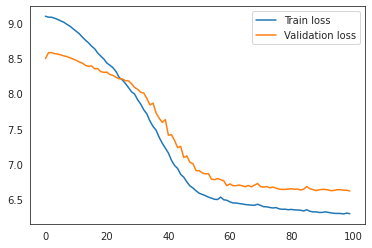

Encoding shape: (2419, 50)
(2419, 2)
(2419, 50) (2419,) (2419,)


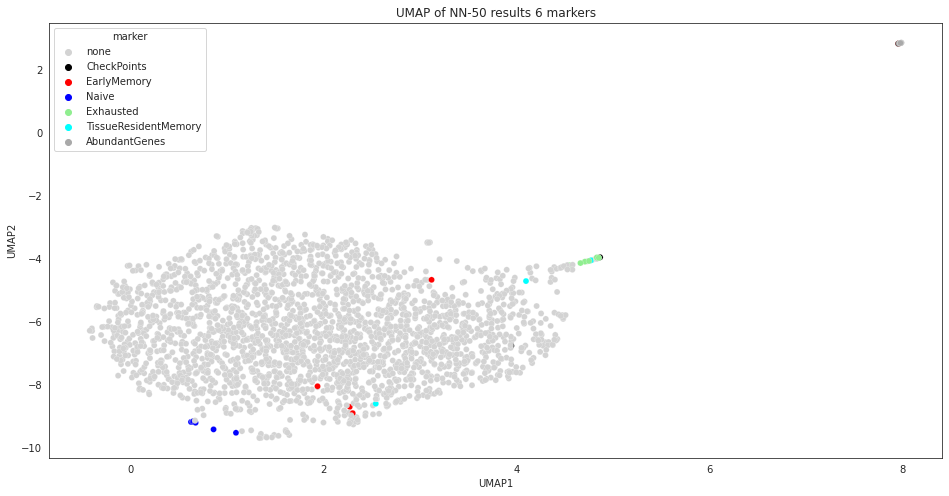

**********************************************************************
Modeling for 100 dimensions
Shape of the dataset for the modelling: (2419, 1633)
Shape of the train set: (2177, 1633), shape of the validation set (242, 1633)
Number of features for the train: 1633
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=1633, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=100, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=100, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01

 10%|█         | 10/100 [00:07<01:06,  1.36it/s]

Epoch 10: train loss 8.905378958758186; valid loss 8.48597272237142


 20%|██        | 20/100 [00:14<00:59,  1.34it/s]

Epoch 20: train loss 8.473675952238196; valid loss 8.310949643452963


 30%|███       | 30/100 [00:22<00:52,  1.34it/s]

Epoch 30: train loss 7.923824198105756; valid loss 8.054957389831543


 40%|████      | 40/100 [00:29<00:44,  1.36it/s]

Epoch 40: train loss 7.12565406631021; valid loss 7.487357298533122


 50%|█████     | 50/100 [00:37<00:36,  1.37it/s]

Epoch 50: train loss 6.527538061141968; valid loss 6.8898115158081055


 60%|██████    | 60/100 [00:44<00:29,  1.34it/s]

Epoch 60: train loss 6.374924968270695; valid loss 6.730143706003825


 70%|███████   | 70/100 [00:52<00:22,  1.36it/s]

Epoch 70: train loss 6.300952322342816; valid loss 6.623971621195476


 80%|████████  | 80/100 [00:59<00:14,  1.35it/s]

Epoch 80: train loss 6.226954151602352; valid loss 6.608625729878743


 90%|█████████ | 90/100 [01:06<00:07,  1.35it/s]

Epoch 90: train loss 6.178485533770393; valid loss 6.591637293497722


100%|██████████| 100/100 [01:14<00:00,  1.34it/s]

Epoch 100: train loss 6.1514418826383706; valid loss 6.583926359812419


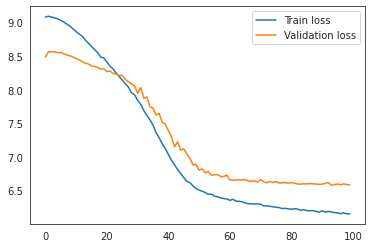

Encoding shape: (2419, 100)
(2419, 2)
(2419, 100) (2419,) (2419,)


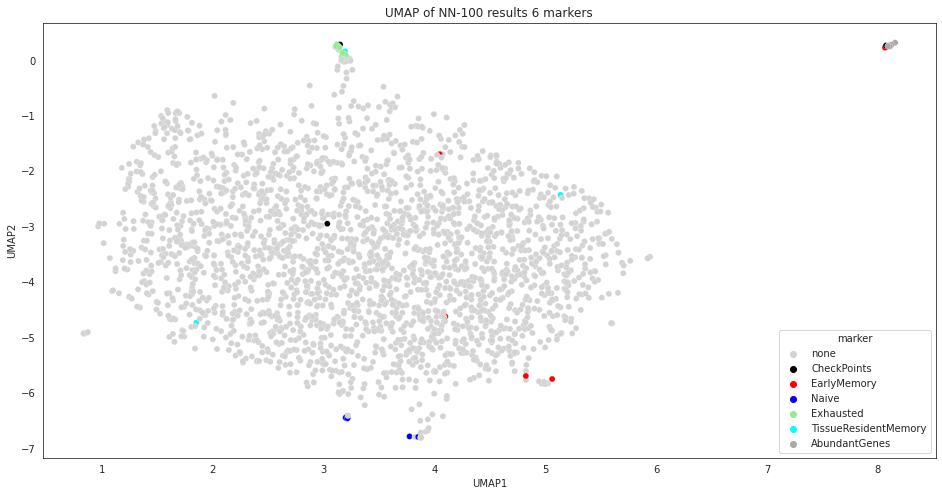

Running the Neural Network on the same params: hepa, 7 markers
**********************************************************************
Modeling for 10 dimensions
Shape of the dataset for the modelling: (2428, 1633)
Shape of the train set: (2185, 1633), shape of the validation set (243, 1633)
Number of features for the train: 1633
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=1633, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=10, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=10, out_features=

 10%|█         | 10/100 [00:07<01:08,  1.31it/s]

Epoch 10: train loss 8.837467179578894; valid loss 9.156623840332031


 20%|██        | 20/100 [00:15<00:59,  1.34it/s]

Epoch 20: train loss 8.426948182723102; valid loss 8.606037775675455


 30%|███       | 30/100 [00:22<00:52,  1.33it/s]

Epoch 30: train loss 8.032100214677698; valid loss 8.430153210957846


 40%|████      | 40/100 [00:30<00:45,  1.32it/s]

Epoch 40: train loss 7.413729835959042; valid loss 8.081559181213379


 50%|█████     | 50/100 [00:37<00:37,  1.33it/s]

Epoch 50: train loss 6.784191945019891; valid loss 7.368327935536702


 60%|██████    | 60/100 [00:45<00:29,  1.33it/s]

Epoch 60: train loss 6.629429606830373; valid loss 7.037110010782878


 70%|███████   | 70/100 [00:52<00:22,  1.32it/s]

Epoch 70: train loss 6.584967304678524; valid loss 6.967673619588216


 80%|████████  | 80/100 [01:00<00:15,  1.33it/s]

Epoch 80: train loss 6.561887741088867; valid loss 6.955564657847087


 90%|█████████ | 90/100 [01:08<00:07,  1.31it/s]

Epoch 90: train loss 6.557736326666439; valid loss 6.979680856068929


100%|██████████| 100/100 [01:15<00:00,  1.32it/s]

Epoch 100: train loss 6.536041568307316; valid loss 6.966418266296387


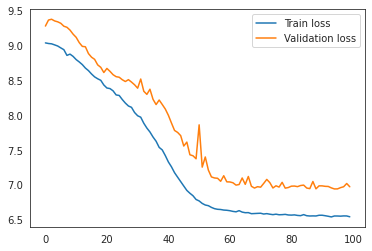

Encoding shape: (2428, 10)
(2428, 2)
(2428, 10) (2428,) (2428,)


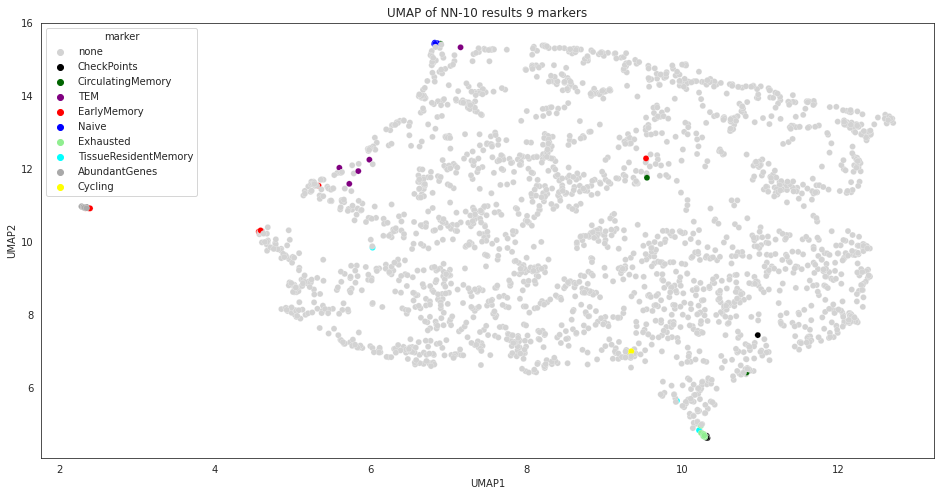

**********************************************************************
Modeling for 50 dimensions
Shape of the dataset for the modelling: (2428, 1633)
Shape of the train set: (2185, 1633), shape of the validation set (243, 1633)
Number of features for the train: 1633
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=1633, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=50, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=50, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
  

 10%|█         | 10/100 [00:07<01:08,  1.32it/s]

Epoch 10: train loss 8.852132222231697; valid loss 9.182423909505209


 20%|██        | 20/100 [00:15<01:00,  1.31it/s]

Epoch 20: train loss 8.418433736352359; valid loss 8.711140314737955


 30%|███       | 30/100 [00:22<00:53,  1.31it/s]

Epoch 30: train loss 7.9347454660079055; valid loss 8.387931187947592


 40%|████      | 40/100 [00:30<00:45,  1.31it/s]

Epoch 40: train loss 7.202428256764131; valid loss 7.886806964874268


 50%|█████     | 50/100 [00:38<00:38,  1.29it/s]

Epoch 50: train loss 6.619608486399931; valid loss 7.529695351918538


 60%|██████    | 60/100 [00:46<00:30,  1.30it/s]

Epoch 60: train loss 6.450100057265338; valid loss 6.947753270467122


 70%|███████   | 70/100 [00:53<00:22,  1.31it/s]

Epoch 70: train loss 6.384792776668773; valid loss 6.901543617248535


 80%|████████  | 80/100 [01:01<00:15,  1.28it/s]

Epoch 80: train loss 6.337465945412131; valid loss 6.938311735788981


 90%|█████████ | 90/100 [01:09<00:07,  1.27it/s]

Epoch 90: train loss 6.293811868218815; valid loss 6.865380605061849


100%|██████████| 100/100 [01:17<00:00,  1.30it/s]

Epoch 100: train loss 6.276878441081328; valid loss 6.856973012288411


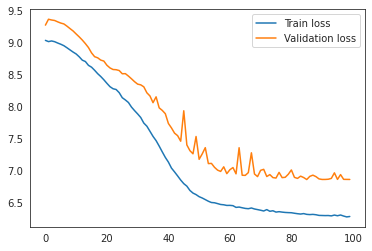

Encoding shape: (2428, 50)
(2428, 2)
(2428, 50) (2428,) (2428,)


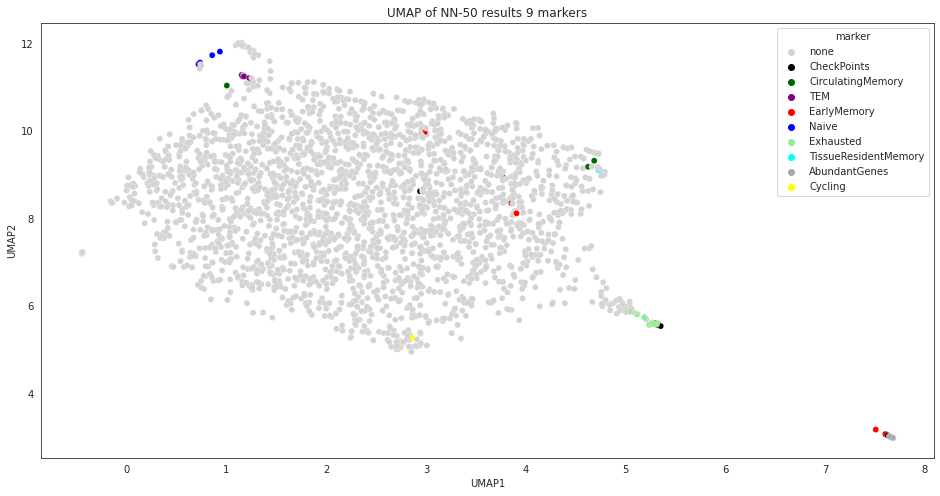

**********************************************************************
Modeling for 100 dimensions
Shape of the dataset for the modelling: (2428, 1633)
Shape of the train set: (2185, 1633), shape of the validation set (243, 1633)
Number of features for the train: 1633
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=1633, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=100, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=100, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01

 10%|█         | 10/100 [00:07<01:09,  1.30it/s]

Epoch 10: train loss 8.837016456267413; valid loss 9.140366554260254


 20%|██        | 20/100 [00:15<01:01,  1.29it/s]

Epoch 20: train loss 8.367025193046121; valid loss 8.634487787882486


 30%|███       | 30/100 [00:23<00:55,  1.26it/s]

Epoch 30: train loss 7.862216093960931; valid loss 8.350992520650228


 40%|████      | 40/100 [00:31<00:47,  1.26it/s]

Epoch 40: train loss 7.113644613939173; valid loss 7.711962540944417


 50%|█████     | 50/100 [00:39<00:40,  1.25it/s]

Epoch 50: train loss 6.533565885880414; valid loss 7.167234897613525


 60%|██████    | 60/100 [00:47<00:32,  1.25it/s]

Epoch 60: train loss 6.354086917989394; valid loss 6.92864465713501


 70%|███████   | 70/100 [00:55<00:24,  1.24it/s]

Epoch 70: train loss 6.271095963085399; valid loss 6.835310459136963


 80%|████████  | 80/100 [01:03<00:16,  1.25it/s]

Epoch 80: train loss 6.213112901238834; valid loss 6.83103084564209


 90%|█████████ | 90/100 [01:11<00:07,  1.26it/s]

Epoch 90: train loss 6.172744386336383; valid loss 6.817934036254883


100%|██████████| 100/100 [01:19<00:00,  1.25it/s]

Epoch 100: train loss 6.13955356093014; valid loss 6.791688124338786


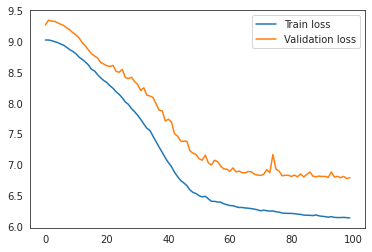

Encoding shape: (2428, 100)
(2428, 2)
(2428, 100) (2428,) (2428,)


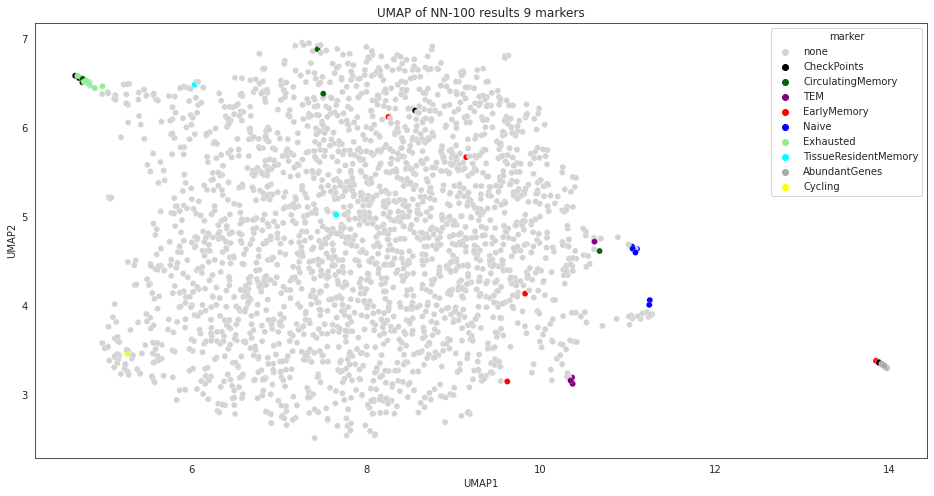

In [ ]:
encoding_dict = NN_run(pca_dict, csv_save=False)

In [ ]:
#saving the result to csv
#print(len(encoding_dict))
for key in encoding_dict.keys():
  print(f'Encoding shape: {encoding_dict[key][0].shape}')
  n_dim = key.split('_')[-1]
  len_mrkrs = key.split('_')[-2]
  dataset_name= key.split('_')[0]
  columns = list(range(1, int(n_dim)+1))
  encodings_df = pd.DataFrame(data=encoding_dict[key][0], columns=columns)
  res = pd.concat([encodings_df, encoding_dict[key][1], encoding_dict[key][2]], axis=1)
  print(f'Saving csv file with the results of NN modeling, dimensions {n_dim}, markers {len_mrkrs}')
  name_file= dataset_name +'_' + len_mrkrs +'_NN_'+ n_dim + '_' + datetime.now().strftime("%d-%m") + '.csv'
  res.to_csv(os.path.join(home_path, name_file))


Encoding shape: (2342, 10)
Saving csv file with the results of NN modeling, dimensions 10, markers 6
Encoding shape: (2342, 50)
Saving csv file with the results of NN modeling, dimensions 50, markers 6
Encoding shape: (2342, 100)
Saving csv file with the results of NN modeling, dimensions 100, markers 6
Encoding shape: (2348, 10)
Saving csv file with the results of NN modeling, dimensions 10, markers 9
Encoding shape: (2348, 50)
Saving csv file with the results of NN modeling, dimensions 50, markers 9
Encoding shape: (2348, 100)
Saving csv file with the results of NN modeling, dimensions 100, markers 9
Encoding shape: (2415, 10)
Saving csv file with the results of NN modeling, dimensions 10, markers 6
Encoding shape: (2415, 50)
Saving csv file with the results of NN modeling, dimensions 50, markers 6
Encoding shape: (2415, 100)
Saving csv file with the results of NN modeling, dimensions 100, markers 6
Encoding shape: (2423, 10)
Saving csv file with the results of NN modeling, dimension

###Two sets of markers in a row and several dims

In [ ]:
def pipeline_run(dataset):
    print(f'Dataset {dataset_name}. \nRunning data preparation for {marker} markers')
    print(dataset.shape)
    print(f'Thresholds used: {thresholds[dataset_name][0], thresholds[dataset_name][1]}')
    #get training set
    training_set, var_df = prep_data_PCA(markers, thresholds[dataset_name][0], thresholds[dataset_name][1], dataset=dataset, home_path=None, path_dataset=None, dataset_name=None )

    print(f'Running PCA for {dims} dimensions')
    pca_df, var_pc = running_PCA(training_set, num_comp=dims[-1], home_path=None)

    for dim_size in dims:
      pca_to_print=pca_df[pca_df.columns[:dim_size]].copy()
      pca_to_print = pd.concat([pca_to_print, pca_df[pca_df.columns[-2:]]], axis=1)
      title = str(len(markers)) + ' markers, PCA - ' + str(dim_size) +'components'
      plotting_res_sns(pca_to_print, var_pc[:dim_size], 'PC2', 'PC3',color_marker, title)
      plotting_res_plotly(pca_df, var_pc, 'PC2', 'PC3',color_marker, title)  
    
    print('Printing UMAP maps for PCA results... ')
    for dim_size in dims:
      title = 'UMAP of PCA-' + str(dim_size) + ' results ' + str(len(markers)) + ' markers'
      umap_embedding(pca_df[pca_df.columns[:dim_size]], pca_df['gene'], pca_df['marker'], title)
    

    print('Running the Neural Network on the same params')
    for dim_size in dims:
      model, X_nn, gene_labels_fin, gene_markers_fin = data_prep_train_for_NN(training_set=training_set, n_dim=dim_size, n_epochs=n_epochs, batch_size=batch_size)
      encodings = test_NN_print_result(model, X_nn, gene_labels_fin, gene_markers_fin, dim_size, batch_size=batch_size)
      title = 'UMAP of NN-' + str(dim_size) + ' results ' + str(len(markers)) + ' markers'
      umap_embedding(encodings, gene_labels_fin, gene_markers_fin, title)


    return training_set, pca_df


#to load the model if needed - to find where it is located 
#model.load_state_dict(torch.load(path_model))

If only one set of markers needed correct the first variable num_markers

In [ ]:
num_markers = [7]
#print('Datasets: 0 - NSCLC, 1- CRC1, 2- CRC2, 3- HEPA, 4-MELANOMA')
#index_dataset = int(input('Input the index of the dataset you are interested in: '))
index_dataset = 1
#n = int(input('Input how many different dimensions you want to check for PCA and NN (1, 2, 3, 4, 5?): '))
#dims=np.zeros(n, dtype=int)
#for i in range(n):
#  dims[i]=int(input(f'Input the number of dimensions for the {i+1} run (10-50-100?): '))
#print(f'So, the following dimensions will be checked: ', dims)
dims = [100]   # if you need to check different dimensions --> change dims

check_points = ['CheckPoints']
markers_check = ['AbundantGenes']

thresholds={'NSCLC':[0.72, 2.1], 'crc1':[0.71, 2.1], 'crc2':[0.8, 1.9], 
            'hepa':[0.849, 1.9], 'mel' :[0.71, 2.1]}
datasets = ['NSCLC', 'crc1', 'crc2', 'hepa', 'mel']
dataset_name = datasets[index_dataset]
home_path = '/content/gdrive/MyDrive/CPP_data/'

path_dataset = '/content/gdrive/MyDrive/CPP_data/' + datasets[index_dataset] + '_filtered_allmarkers.gzip'
path_labels = '/content/gdrive/MyDrive/CPP_data/labels_' + datasets[index_dataset]

    #cell_name_to_filter = 'TTC'  #dataset is filtered already
    #NSCLC thresholds 1.2998407729691086/0.7345407510056047 = 1.76
    #CRC2 thresholds 1.346980341580908/0.8146161428779355 = 1.65
    #hepa thresholds 1.3892587059716444 / 0.8494661794810161 = 1.63
n_epochs=100
batch_size=64

for marker in num_markers:
    if marker == 4:
      color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                            'EarlyMemory': 'red', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
      markers = markers_four
      main_markers = {k: v for k, v in markers_four.items() if k not in ['AbundantGenes', 'CheckPoints']}
      dataset = pd.read_parquet(path_dataset)
      dataset = dataset.drop('markers9', axis=1)
      dataset.rename(columns={'markers6':'marker'}, inplace=True)
    else:                        
      color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                            'EarlyMemory': 'red','TEM': 'purple','CirculatingMemory': 'darkgreen',
                            'Cycling': 'yellow', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
      markers = markers_last
      main_markers = {k: v for k, v in markers_last.items() if k not in ['AbundantGenes', 'CheckPoints']}
      dataset = pd.read_parquet(path_dataset)
      dataset = dataset.drop('markers6', axis=1)
      dataset.rename(columns={'markers9':'marker'}, inplace=True)
   
    #RUN THE MAIN SCRIPT
    
    training_set, pca_df = pipeline_run(dataset)

training_set.gene.nunique()

Dataset crc1. 
Running data preparation for 7 markers
(15179, 2475)
Thresholds used: (0.71, 2.1)
Dataset shape:  (15179, 2475)
x_labels shape (15179,) x_markers shape (15179,)
Markers values: 
 none                    15130
AbundantGenes               9
EarlyMemory                 7
Exhausted                   7
CheckPoints                 6
Naive                       6
TEM                         5
CirculatingMemory           4
TissueResidentMemory        3
Cycling                     2
Name: marker, dtype: int64
X for PCA shape:  (15179, 2475)
variance table        Mean       Std  gene
0  1.151983  1.047448  A1BG
1  0.001261  0.055187  NAT2
2  1.208644  1.322379   ADA
3  0.718779  1.139177  AKT3
4  1.250000  1.306841  MED6
variance tables shape (15179, 3)
**********************************************************************
Training set shape (0, 2475)
Adding markers (check if they were deleted)
**********************************************************************
Found gene that 

KeyboardInterrupt: ignored

**********************************************************************
Modeling for 100 dimensions
Shape of the dataset for the modelling: (2348, 2182)
Shape of the train set: (2113, 2182), shape of the validation set (235, 2182)
Number of features for the train: 2182
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=2182, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=100, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=100, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01

 10%|█         | 10/100 [00:10<01:35,  1.06s/it]

Epoch 10: train loss 7.711564481258392; valid loss 8.060978889465332


 20%|██        | 20/100 [00:21<01:24,  1.06s/it]

Epoch 20: train loss 7.614590644836426; valid loss 7.913492202758789


 30%|███       | 30/100 [00:32<01:15,  1.07s/it]

Epoch 30: train loss 7.383038759231567; valid loss 7.611091613769531


 40%|████      | 40/100 [00:43<01:06,  1.11s/it]

Epoch 40: train loss 7.261858820915222; valid loss 7.318249225616455


 50%|█████     | 50/100 [00:53<00:53,  1.07s/it]

Epoch 50: train loss 7.077817380428314; valid loss 7.136874675750732


 60%|██████    | 60/100 [01:04<00:41,  1.04s/it]

Epoch 60: train loss 6.904270708560944; valid loss 7.003458499908447


 70%|███████   | 70/100 [01:14<00:31,  1.05s/it]

Epoch 70: train loss 6.768842816352844; valid loss 6.911369800567627


 80%|████████  | 80/100 [01:25<00:20,  1.04s/it]

Epoch 80: train loss 6.529577434062958; valid loss 6.76643705368042


 90%|█████████ | 90/100 [01:35<00:10,  1.05s/it]

Epoch 90: train loss 6.326206207275391; valid loss 6.643774032592773


100%|██████████| 100/100 [01:46<00:00,  1.06s/it]

Epoch 100: train loss 6.100141793489456; valid loss 6.492223262786865


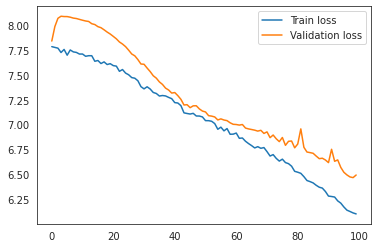

Encoding shape: (2348, 100)
(2348, 2)
(2348, 100) (2348,) (2348,)


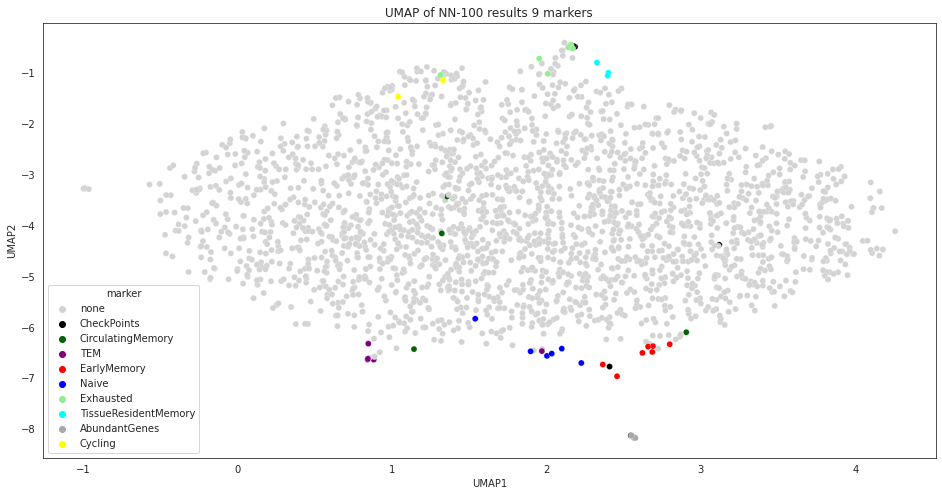

In [ ]:
dim_size=100
n_epochs=100
batch_size=128
model, X_nn, gene_labels_fin, gene_markers_fin = data_prep_train_for_NN(training_set, dim_size, n_epochs=n_epochs, batch_size=batch_size)
#data_prep_train_for_NN(training_set, dim_size, n_epochs, batch_size)
encodings = test_NN_print_result(model, X_nn, gene_labels_fin, gene_markers_fin, dim_size, batch_size=batch_size)
title = 'UMAP of NN-' + str(dim_size) + ' results ' + str(len(markers)) + ' markers'
umap_embedding(encodings, gene_labels_fin, gene_markers_fin, title)


In [ ]:
training_set, var_df = prep_data_PCA(markers, thresholds[dataset_name][0], thresholds[dataset_name][1], dataset=dataset, home_path=None, path_dataset=None, dataset_name=None )


x_labels = dataset['gene']
x_markers = dataset['marker']
print('x_labels shape', x_labels.shape, 'x_markers shape', x_markers.shape)
X = dataset.drop(['gene', 'marker'], axis=1)
if dataset['marker'].isna().sum() > 0:
  dataset['marker'].fillna('none', inplace=True)
print('Markers values: \n', dataset['marker'].value_counts())
X = np.log2(X+1)
X['gene'] = x_labels
X['marker'] = x_markers
print('X for PCA shape: ', X.shape)
#calculating variance for every gene
genes_var = variance_set(X, x_labels)
#filtering genes according to the threshold
training_set = X[(genes_var.Mean>thresholds[dataset_name][0])&((genes_var.Std/genes_var.Mean)>thresholds[dataset_name][1])]

0.6384307766275834

#### To run NN algo on dataset

Running data preparation for 4 markers
Index(['symbol', 'TTC100-0616A', 'TTC10-0616A', 'TTC101-0616A',
       'TTC102-0616A'],
      dtype='object')
NSCLC  data shape: (23459, 2184)
************************************************
Filtering Mitochondrial and Mirna genes..
************************************************
The total number of genes filtered out by R[NUP] :  343
The total number of genes filtered out by MIR :  1258
The total number of genes filtered out by MT :  93
Final dataset shape:  (21765, 2184)
************************************************
************************************************
Total number of markers used 40
Adding markers...
************************************************
Found gene that was absent. Adding it... RPL19
Total number of markers 40
Total number of markers added 1
************************************************
************************************************
Total markers for key Naive is: 6
Total markers for key EarlyMemory is: 8
Total 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



variance tables shape (21766, 1)
x_labels (21766,)
x_labels index RangeIndex(start=0, stop=21766, step=1)
genes_var index RangeIndex(start=0, stop=21766, step=1)
difference in indexes []
(21766, 2185)
variance tables shape (21766, 3)
variance table          Var      Mean       Std  gene
0   3.534065  0.839759  1.879911  A1BG
1   0.045334  0.008948  0.212918  NAT2
2  14.288587  2.343138  3.780025   ADA
3   0.003878  0.002864  0.062271  CDH2
4   3.796691  0.731008  1.948510  AKT3
variance tables shape (21766, 4)
************************************************
Training set shape (2296, 2185)
Adding markers (check if they were deleted)
************************************************
Found gene that was absent. Adding it... TCF7
Found gene that was absent. Adding it... IL7R
Found gene that was absent. Adding it... CCR7
Found gene that was absent. Adding it... SELL
Found gene that was absent. Adding it... LTB
Found gene that was absent. Adding it... GZMK
Found gene that was absent. Adding 

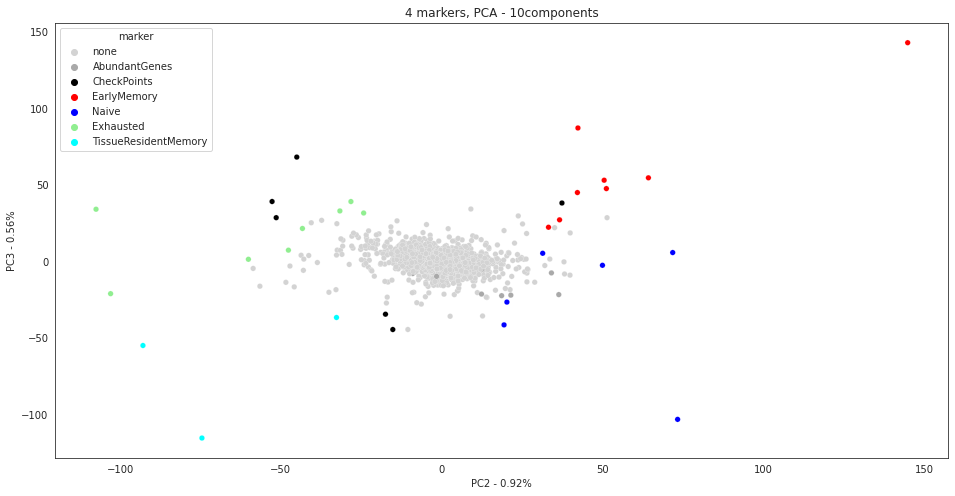

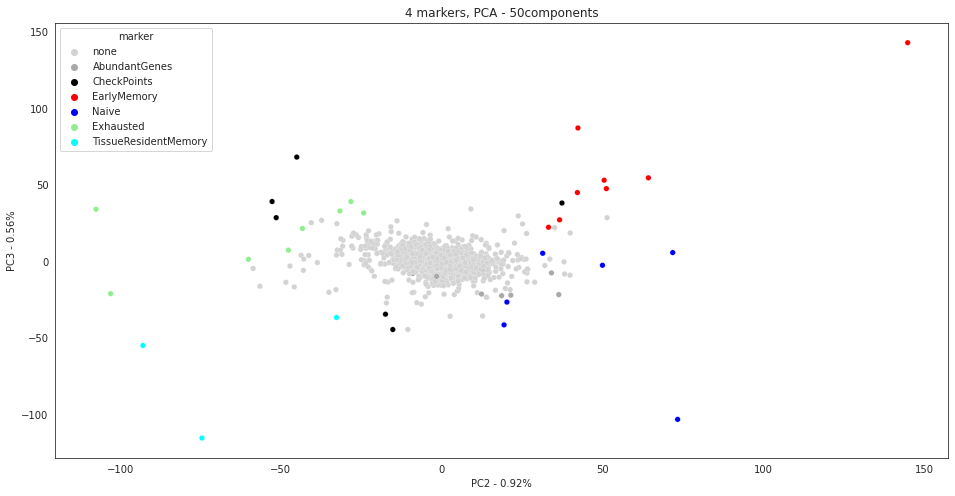

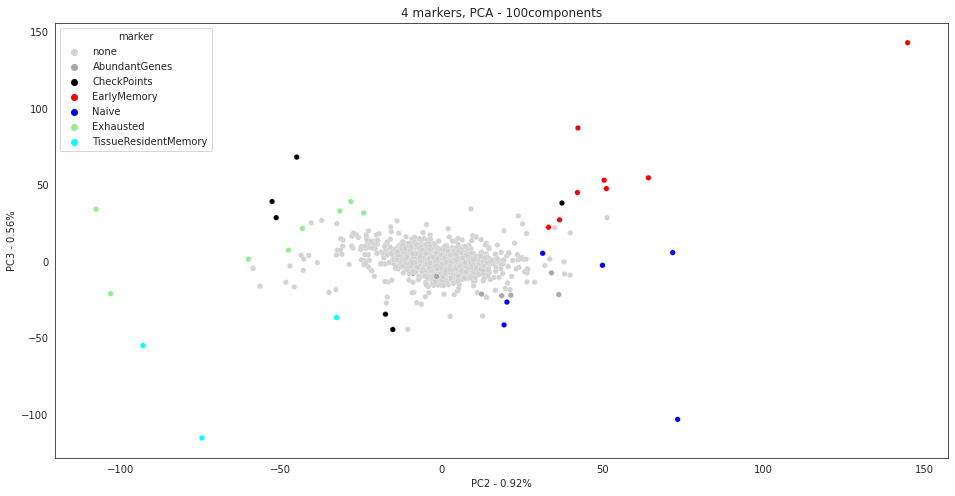

Printing UMAP maps... 
(2330, 2)
(2330, 10) (2330,) (2330,)


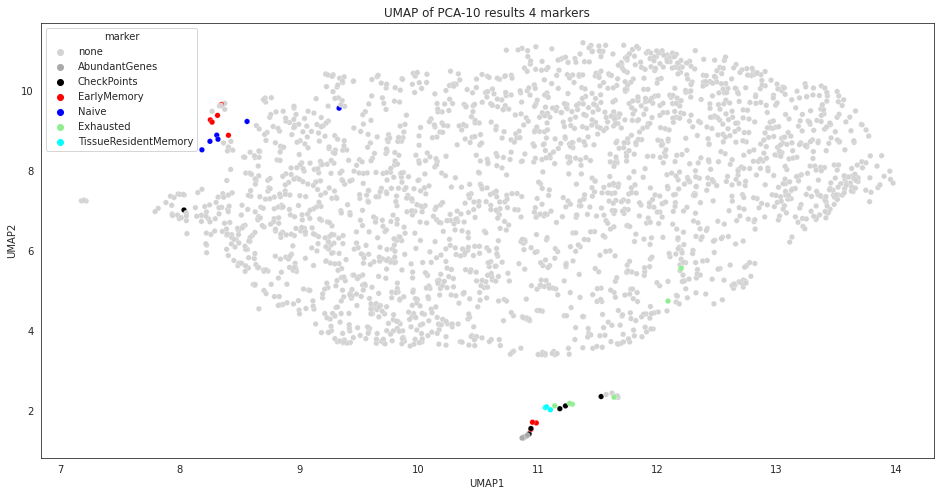

(2330, 2)
(2330, 50) (2330,) (2330,)


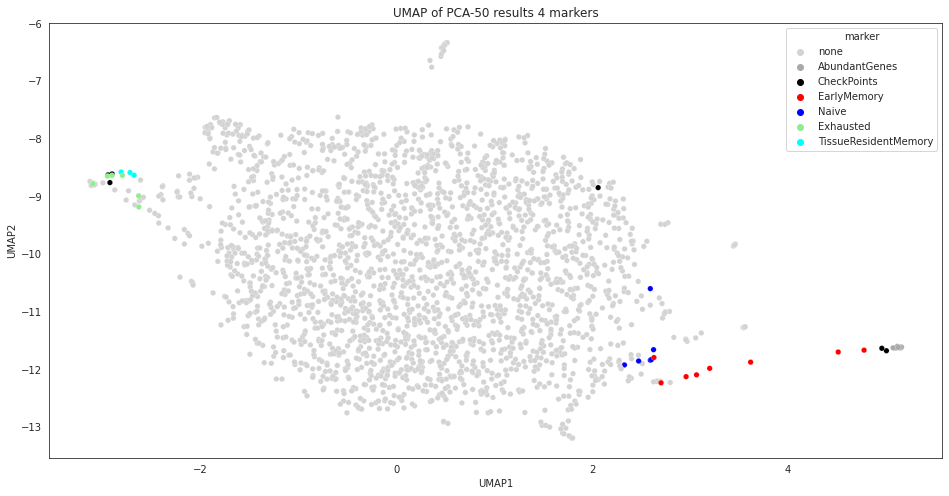

(2330, 2)
(2330, 100) (2330,) (2330,)


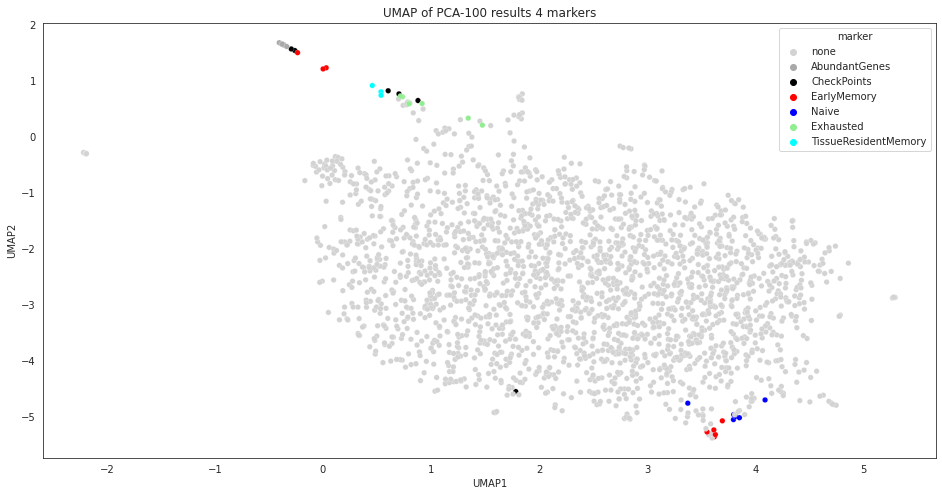

Running the Neural Network on the same params
Shape of the dataset for the modelling: (2330, 2183)
Shape of the train set: (2097, 2183), shape of the validation set (233, 2183)
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=2183, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=10, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=10, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)

 67%|██████▋   | 10/15 [00:08<00:04,  1.17it/s]

Epoch 10: train loss 5.725921074435662; valid loss 5.651055573393858


100%|██████████| 15/15 [00:12<00:00,  1.16it/s]


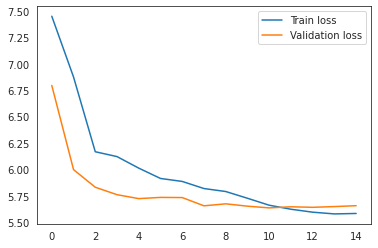

Encoding shape: (2330, 10)
Saving csv file with the results of NN modeling, dimensions 10, markers 6
(2330, 2)
(2330, 10) (2330,) (2330,)


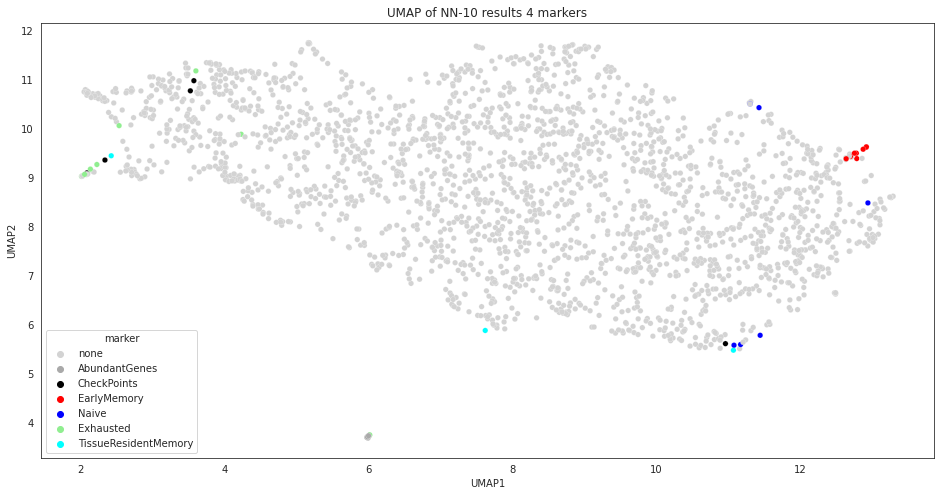

Shape of the dataset for the modelling: (2330, 2183)
Shape of the train set: (2097, 2183), shape of the validation set (233, 2183)
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=2183, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=50, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=50, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): LinBnDrop(
        (0): Li

 67%|██████▋   | 10/15 [00:08<00:04,  1.15it/s]

Epoch 10: train loss 5.427281746025249; valid loss 5.5801630490839225


100%|██████████| 15/15 [00:13<00:00,  1.14it/s]


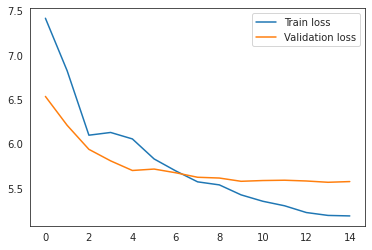

Encoding shape: (2330, 50)
Saving csv file with the results of NN modeling, dimensions 50, markers 6
(2330, 2)
(2330, 50) (2330,) (2330,)


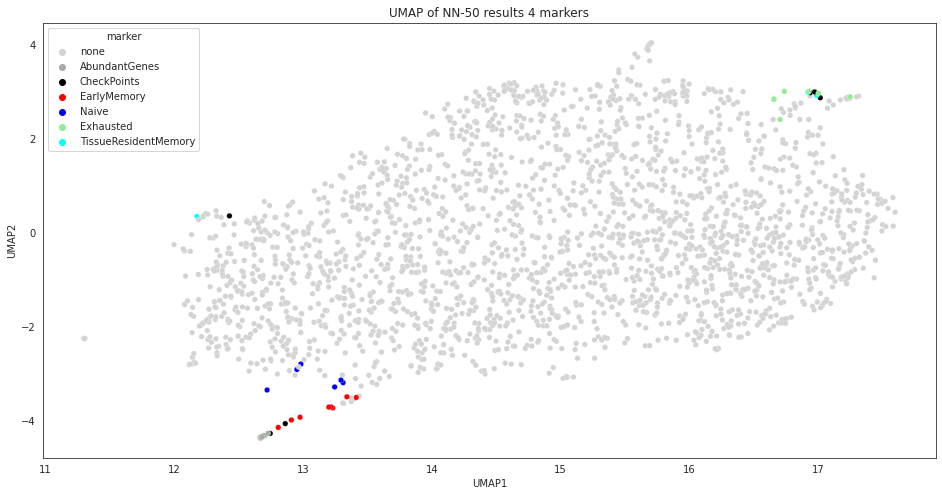

Shape of the dataset for the modelling: (2330, 2183)
Shape of the train set: (2097, 2183), shape of the validation set (233, 2183)
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=2183, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=100, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=100, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): LinBnDrop(
        (0):

 67%|██████▋   | 10/15 [00:08<00:04,  1.11it/s]

Epoch 10: train loss 5.277246099116407; valid loss 5.569248970997692


100%|██████████| 15/15 [00:13<00:00,  1.12it/s]


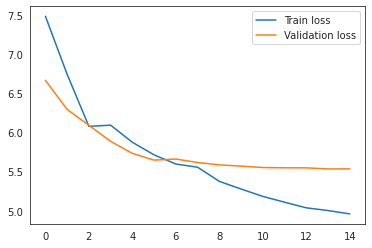

Encoding shape: (2330, 100)
Saving csv file with the results of NN modeling, dimensions 100, markers 6
(2330, 2)
(2330, 100) (2330,) (2330,)


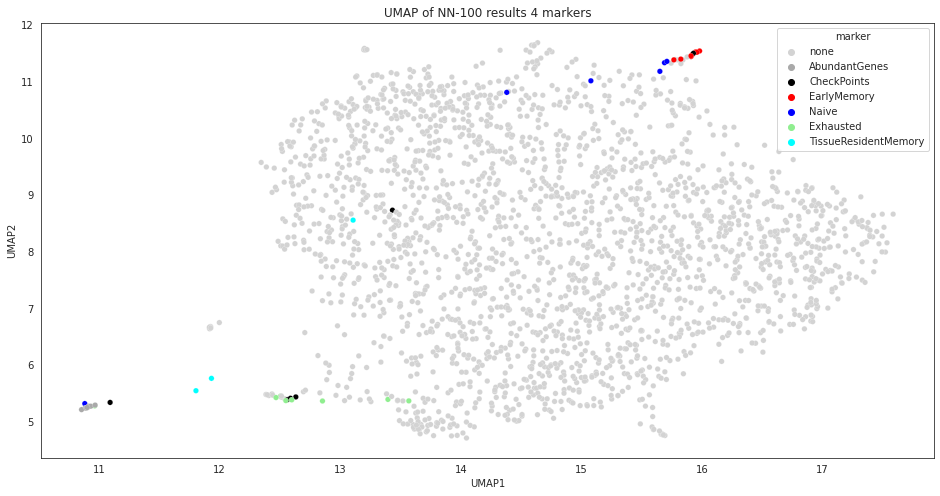

### To run code for NN separately

(2334, 2)
(2334, 50) (2334,) (2334,)


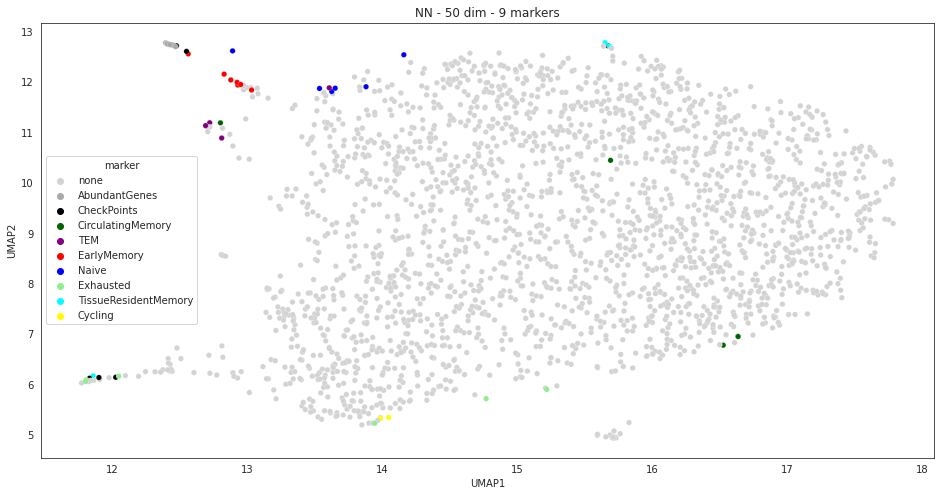

In [ ]:
num_markers = 7
if num_markers == 4:
  color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                        'EarlyMemory': 'red', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
  markers = markers_four
else:                        
  color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                        'EarlyMemory': 'red','TEM': 'purple','CirculatingMemory': 'darkgreen',
                        'Cycling': 'yellow', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
  markers = markers_last

NSCLC_NN_9_100 = pd.read_csv('NSCLC_9_NN_100_15-04_13:08.csv')

NSCLC_NN_9_50 = pd.read_csv('NSCLC_9_NN_50_15-04_13:07.csv')
encodings = NSCLC_NN_9_50[NSCLC_NN_9_50.columns[1:51]]
gene_markers_fin = NSCLC_NN_9_50.gene
gene_labels_fin = NSCLC_NN_9_50.marker
umap_embedding(encodings, gene_labels_fin, gene_markers_fin, 'NN - 50 dim - 9 markers')

# Sum by columns check

In [ ]:
data_crc1_filtered = pd.read_parquet('/content/gdrive/MyDrive/CPP_data/data_crc1_filtered.gzip')  
data_crc1_filtered.sum(axis=0)

GENE               A1BGNAT2ADAAKT3MED6NAALAD2DDTLNAALADL1GUSBP9SI...
P_N_P0305_00203                                         13800.812411
P_P_P0305_00238                                         20100.811016
P_P_P0305_00338                                         16980.031943
P_P_P0305_00343                                         16557.005879
                                         ...                        
P_T_P1228_11149                                         19237.320518
P_T_P1228_11154                                          17590.19341
P_T_P1228_11159                                         17464.114099
P_T_P1228_11160                                           17197.3636
P_T_P1228_11164                                         17583.298946
Length: 2474, dtype: object

In [ ]:
data_crc2_filtered = pd.read_parquet('/content/gdrive/MyDrive/CPP_data/data_crc2_filtered.gzip')  
data_crc2_filtered.sum(axis=0)

symbol             A1BGNAT2ADACDH2AKT3GAGE12FZBTB11-AS1MED6NR2E3N...
NTC100-20180123                                            1000000.0
NTC101-20180123                                            1000000.0
NTC102-20180123                                            1000000.0
NTC103-20180123                                            1000000.0
                                         ...                        
PTC91-20161228                                             1000000.0
PTC9-20161228                                              1000000.0
PTC92-20161228                                             1000000.0
PTC94-20161228                                             1000000.0
PTC96-20161228                                             1000000.0
Length: 3708, dtype: object

In [ ]:
data_hepa_filtered = pd.read_parquet('/content/gdrive/MyDrive/CPP_data/data_hepa_filtered.gzip')  
data_hepa_filtered.sum(axis=0)

symbol         A1BGNAT2ADACDH2AKT3GAGE12FZBTB11-AS1MED6NR2E3N...
PTC141-0205                                            1000000.0
PTC142-0205                                            1000000.0
PTC143-0205                                            1000000.0
PTC144-0205                                            1000000.0
                                     ...                        
PTC37-0508                                             1000000.0
PTC39-0508                                             1000000.0
PTC40-0508                                             1000000.0
TTC26-0508                                             1000000.0
TTC74-0508                                             1000000.0
Length: 1634, dtype: object

In [ ]:
data_NSCLC_filtered = pd.read_parquet('/content/gdrive/MyDrive/CPP_data/data_NSCLC_filtered.gzip')  
data_NSCLC_filtered.sum(axis=0)

symbol            A1BGNAT2ADACDH2AKT3GAGE12FZBTB11-AS1MED6NR2E3N...
TTC100-0616A                                             1000000.12
TTC10-0616A                                              1000000.27
TTC101-0616A                                              999999.92
TTC102-0616A                                              999999.91
                                        ...                        
TTC63-20171219                                           1000000.15
TTC64-20171219                                            999999.84
TTC7-20171219                                            1000000.16
TTC8-20171219                                            1000000.07
TTC9-20171219                                             999999.89
Length: 2183, dtype: object

In [ ]:
data_mel_filtered = pd.read_parquet('/content/gdrive/MyDrive/CPP_data/data_mel_filtered.gzip')  
data_mel_filtered.sum(axis=0)

Gene                          TSPAN6TNMDDPM1SCYL3C1orf112FGRCFHFUCA2GCLCNFYA...
A12_P6_M11                                                              18240.4
A2_P4_M11                                                              15494.28
A4_P3_M11                                                              21295.04
A4_P4_M11                                                               17111.7
                                                    ...                        
F1_P5_M67_L001_T_enriched                                              24675.67
G12_P5_M67_L001_T_enriched                                             20759.87
G5_P5_M67_L001_T_enriched                                               16423.6
H7_P5_M67_L001_T_enriched                                              20217.66
H8_P5_M67_L001_T_enriched                                               8411.66
Length: 6462, dtype: object